In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

pd.set_option('display.max_rows', 50)
pd.set_option('display.max_columns', None)

In [2]:
df = pd.read_csv('loan.csv')

In [3]:
df.shape

(39717, 111)

In [4]:
df.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39717 entries, 0 to 39716
Data columns (total 111 columns):
 #    Column                          Non-Null Count  Dtype  
---   ------                          --------------  -----  
 0    id                              39717 non-null  int64  
 1    member_id                       39717 non-null  int64  
 2    loan_amnt                       39717 non-null  int64  
 3    funded_amnt                     39717 non-null  int64  
 4    funded_amnt_inv                 39717 non-null  float64
 5    term                            39717 non-null  object 
 6    int_rate                        39717 non-null  object 
 7    installment                     39717 non-null  float64
 8    grade                           39717 non-null  object 
 9    sub_grade                       39717 non-null  object 
 10   emp_title                       37258 non-null  object 
 11   emp_length                      38642 non-null  object 
 12   home_ownership  

In [5]:
df = df.dropna(axis=1, how='all')

In [6]:
df.shape

(39717, 57)

In [7]:
df.nunique().sort_values()

tax_liens                       1
delinq_amnt                     1
chargeoff_within_12_mths        1
acc_now_delinq                  1
application_type                1
                            ...  
total_pymnt_inv             37518
total_pymnt                 37850
url                         39717
member_id                   39717
id                          39717
Length: 57, dtype: int64

In [8]:
one_value_columns = ['tax_liens', 'delinq_amnt', 'chargeoff_within_12_mths', 'acc_now_delinq', 'application_type', 'policy_code', 'collections_12_mths_ex_med', 'pymnt_plan', 'initial_list_status']

In [9]:
for col in one_value_columns:
    print (df[col].value_counts())

tax_liens
0.0    39678
Name: count, dtype: int64
delinq_amnt
0    39717
Name: count, dtype: int64
chargeoff_within_12_mths
0.0    39661
Name: count, dtype: int64
acc_now_delinq
0    39717
Name: count, dtype: int64
application_type
INDIVIDUAL    39717
Name: count, dtype: int64
policy_code
1    39717
Name: count, dtype: int64
collections_12_mths_ex_med
0.0    39661
Name: count, dtype: int64
pymnt_plan
n    39717
Name: count, dtype: int64
initial_list_status
f    39717
Name: count, dtype: int64


In [10]:
df = df.drop(one_value_columns, axis=1)

In [11]:
100*df.isnull().mean()

id                          0.000000
member_id                   0.000000
loan_amnt                   0.000000
funded_amnt                 0.000000
funded_amnt_inv             0.000000
term                        0.000000
int_rate                    0.000000
installment                 0.000000
grade                       0.000000
sub_grade                   0.000000
emp_title                   6.191303
emp_length                  2.706650
home_ownership              0.000000
annual_inc                  0.000000
verification_status         0.000000
issue_d                     0.000000
loan_status                 0.000000
url                         0.000000
desc                       32.585543
purpose                     0.000000
title                       0.027696
zip_code                    0.000000
addr_state                  0.000000
dti                         0.000000
delinq_2yrs                 0.000000
earliest_cr_line            0.000000
inq_last_6mths              0.000000
m

In [12]:
low_data_columns = ['mths_since_last_record', 'next_pymnt_d', 'mths_since_last_delinq']

In [13]:
df = df.drop(low_data_columns, axis=1)

In [14]:
df.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,last_credit_pull_d,pub_rec_bankruptcies
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,NaN,10+ years,RENT,24000.0,Verified,Dec-11,Fully Paid,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/22/11 > I need to upgra...,credit_card,Computer,860xx,AZ,27.65,0,Jan-85,1,3,0,13648,83.70%,9,0.00,0.00,5863.155187,5833.84,5000.00,863.16,0.00,0.00,0.00,Jan-15,171.62,May-16,0.0
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,Ryder,< 1 year,RENT,30000.0,Source Verified,Dec-11,Charged Off,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/22/11 > I plan to use t...,car,bike,309xx,GA,1.00,0,Apr-99,5,3,0,1687,9.40%,4,0.00,0.00,1008.710000,1008.71,456.46,435.17,0.00,117.08,1.11,Apr-13,119.66,Sep-13,0.0
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,NaN,10+ years,RENT,12252.0,Not Verified,Dec-11,Fully Paid,https://lendingclub.com/browse/loanDetail.acti...,NaN,small_business,real estate business,606xx,IL,8.72,0,Nov-01,2,2,0,2956,98.50%,10,0.00,0.00,3005.666844,3005.67,2400.00,605.67,0.00,0.00,0.00,Jun-14,649.91,May-16,0.0
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,AIR RESOURCES BOARD,10+ years,RENT,49200.0,Source Verified,Dec-11,Fully Paid,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/21/11 > to pay for prop...,other,personel,917xx,CA,20.00,0,Feb-96,1,10,0,5598,21%,37,0.00,0.00,12231.890000,12231.89,10000.00,2214.92,16.97,0.00,0.00,Jan-15,357.48,Apr-16,0.0
4,1075358,1311748,3000,3000,3000.0,60 months,12.69%,67.79,B,B5,University Medical Group,1 year,RENT,80000.0,Source Verified,Dec-11,Current,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/21/11 > I plan on combi...,other,Personal,972xx,OR,17.94,0,Jan-96,0,15,0,27783,53.90%,38,524.06,524.06,3513.330000,3513.33,2475.94,1037.39,0.00,0.00,0.00,May-16,67.79,May-16,0.0


In [15]:
other_unuseful_columns = ['url', 'desc', 'title', 'emp_title', 'id', 'member_id']

In [16]:
df = df.drop(other_unuseful_columns, axis=1)

In [17]:
df.pub_rec_bankruptcies.fillna(0.0)

0        0.0
1        0.0
2        0.0
3        0.0
4        0.0
        ... 
39712    0.0
39713    0.0
39714    0.0
39715    0.0
39716    0.0
Name: pub_rec_bankruptcies, Length: 39717, dtype: float64

In [18]:
df.shape

(39717, 39)

In [19]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39717 entries, 0 to 39716
Data columns (total 39 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   loan_amnt                39717 non-null  int64  
 1   funded_amnt              39717 non-null  int64  
 2   funded_amnt_inv          39717 non-null  float64
 3   term                     39717 non-null  object 
 4   int_rate                 39717 non-null  object 
 5   installment              39717 non-null  float64
 6   grade                    39717 non-null  object 
 7   sub_grade                39717 non-null  object 
 8   emp_length               38642 non-null  object 
 9   home_ownership           39717 non-null  object 
 10  annual_inc               39717 non-null  float64
 11  verification_status      39717 non-null  object 
 12  issue_d                  39717 non-null  object 
 13  loan_status              39717 non-null  object 
 14  purpose               

In [20]:
df.head()

,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,purpose,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,last_credit_pull_d,pub_rec_bankruptcies
0,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,10+ years,RENT,24000.0,Verified,Dec-11,Fully Paid,credit_card,860xx,AZ,27.65,0,Jan-85,1,3,0,13648,83.70%,9,0.00,0.00,5863.155187,5833.84,5000.00,863.16,0.00,0.00,0.00,Jan-15,171.62,May-16,0.0
1,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,< 1 year,RENT,30000.0,Source Verified,Dec-11,Charged Off,car,309xx,GA,1.00,0,Apr-99,5,3,0,1687,9.40%,4,0.00,0.00,1008.710000,1008.71,456.46,435.17,0.00,117.08,1.11,Apr-13,119.66,Sep-13,0.0
2,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,10+ years,RENT,12252.0,Not Verified,Dec-11,Fully Paid,small_business,606xx,IL,8.72,0,Nov-01,2,2,0,2956,98.50%,10,0.00,0.00,3005.666844,3005.67,2400.00,605.67,0.00,0.00,0.00,Jun-14,649.91,May-16,0.0
3,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,10+ years,RENT,49200.0,Source Verified,Dec-11,Fully Paid,other,917xx,CA,20.00,0,Feb-96,1,10,0,5598,21%,37,0.00,0.00,12231.890000,12231.89,10000.00,2214.92,16.97,0.00,0.00,Jan-15,357.48,Apr-16,0.0
4,3000,3000,3000.0,60 months,12.69%,67.79,B,B5,1 year,RENT,80000.0,Source Verified,Dec-11,Current,other,972xx,OR,17.94,0,Jan-96,0,15,0,27783,53.90%,38,524.06,524.06,3513.330000,3513.33,2475.94,1037.39,0.00,0.00,0.00,May-16,67.79,May-16,0.0


In [21]:
df['term_in_months'] = df['term'].apply(lambda x:x[:3]).astype('int')

In [22]:
df['int_rate_in_percent'] = df['int_rate'].apply(lambda x:x[:-1]).astype('float')

In [23]:
mode_emp_length = df.emp_length.mode()[0]

In [24]:
df.emp_length = df.emp_length.fillna(mode_emp_length)

In [25]:
columns_to_remove = ['term', 'int_rate']

In [26]:
df = df.drop(columns_to_remove, axis=1)

In [27]:
df.head()

,loan_amnt,funded_amnt,funded_amnt_inv,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,purpose,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,last_credit_pull_d,pub_rec_bankruptcies,term_in_months,int_rate_in_percent
0,5000,5000,4975.0,162.87,B,B2,10+ years,RENT,24000.0,Verified,Dec-11,Fully Paid,credit_card,860xx,AZ,27.65,0,Jan-85,1,3,0,13648,83.70%,9,0.00,0.00,5863.155187,5833.84,5000.00,863.16,0.00,0.00,0.00,Jan-15,171.62,May-16,0.0,36,10.65
1,2500,2500,2500.0,59.83,C,C4,< 1 year,RENT,30000.0,Source Verified,Dec-11,Charged Off,car,309xx,GA,1.00,0,Apr-99,5,3,0,1687,9.40%,4,0.00,0.00,1008.710000,1008.71,456.46,435.17,0.00,117.08,1.11,Apr-13,119.66,Sep-13,0.0,60,15.27
2,2400,2400,2400.0,84.33,C,C5,10+ years,RENT,12252.0,Not Verified,Dec-11,Fully Paid,small_business,606xx,IL,8.72,0,Nov-01,2,2,0,2956,98.50%,10,0.00,0.00,3005.666844,3005.67,2400.00,605.67,0.00,0.00,0.00,Jun-14,649.91,May-16,0.0,36,15.96
3,10000,10000,10000.0,339.31,C,C1,10+ years,RENT,49200.0,Source Verified,Dec-11,Fully Paid,other,917xx,CA,20.00,0,Feb-96,1,10,0,5598,21%,37,0.00,0.00,12231.890000,12231.89,10000.00,2214.92,16.97,0.00,0.00,Jan-15,357.48,Apr-16,0.0,36,13.49
4,3000,3000,3000.0,67.79,B,B5,1 year,RENT,80000.0,Source Verified,Dec-11,Current,other,972xx,OR,17.94,0,Jan-96,0,15,0,27783,53.90%,38,524.06,524.06,3513.330000,3513.33,2475.94,1037.39,0.00,0.00,0.00,May-16,67.79,May-16,0.0,60,12.69


In [28]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39717 entries, 0 to 39716
Data columns (total 39 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   loan_amnt                39717 non-null  int64  
 1   funded_amnt              39717 non-null  int64  
 2   funded_amnt_inv          39717 non-null  float64
 3   installment              39717 non-null  float64
 4   grade                    39717 non-null  object 
 5   sub_grade                39717 non-null  object 
 6   emp_length               39717 non-null  object 
 7   home_ownership           39717 non-null  object 
 8   annual_inc               39717 non-null  float64
 9   verification_status      39717 non-null  object 
 10  issue_d                  39717 non-null  object 
 11  loan_status              39717 non-null  object 
 12  purpose                  39717 non-null  object 
 13  zip_code                 39717 non-null  object 
 14  addr_state            

In [29]:
cat_cols = ['term_in_months', 'pub_rec_bankruptcies', 'verification_status', 'loan_status', 'home_ownership',
            'grade', 'emp_length', 'purpose']
num_cat_cols = ['pub_rec', 'inq_last_6mths', 'delinq_2yrs']
num_cols = ['open_acc', 'total_acc', 'int_rate_in_percent', 'loan_amnt', 'funded_amnt', 'annual_inc',
            'total_rec_prncp', 'funded_amnt_inv', 'installment', 'revol_bal', 'last_pymnt_amnt',
            'total_rec_int', 'total_pymnt_inv', 'total_pymnt']
other_num_cols = ['out_prncp', 'out_prncp_inv', 'total_rec_late_fee', 'collection_recovery_fee', 'recoveries']
date_cols = ['issue_d', 'last_pymnt_d', 'last_credit_pull_d', 'earliest_cr_line', 'dti']
extra_cols = ['sub_grade', 'addr_state', 'zip_code', 'revol_util']

In [30]:
df.nunique().sort_values()

term_in_months                 2
pub_rec_bankruptcies           3
verification_status            3
loan_status                    3
pub_rec                        5
home_ownership                 5
grade                          7
inq_last_6mths                 9
emp_length                    11
delinq_2yrs                   11
purpose                       14
sub_grade                     35
open_acc                      40
addr_state                    50
issue_d                       55
total_acc                     82
last_pymnt_d                 101
last_credit_pull_d           106
int_rate_in_percent          371
earliest_cr_line             526
zip_code                     823
loan_amnt                    885
funded_amnt                 1041
revol_util                  1089
out_prncp                   1137
out_prncp_inv               1138
total_rec_late_fee          1356
collection_recovery_fee     2616
dti                         2868
recoveries                  4040
annual_inc

In [31]:
df.loan_status.value_counts()

loan_status
Fully Paid     32950
Charged Off     5627
Current         1140
Name: count, dtype: int64

In [32]:
res = df.groupby('loan_status')['pub_rec_bankruptcies'].apply(lambda x : (x.sum()/x.count()) * 100)
res.head()

loan_status
Charged Off    6.716282
Current        3.596491
Fully Paid     3.944889
Name: pub_rec_bankruptcies, dtype: float64

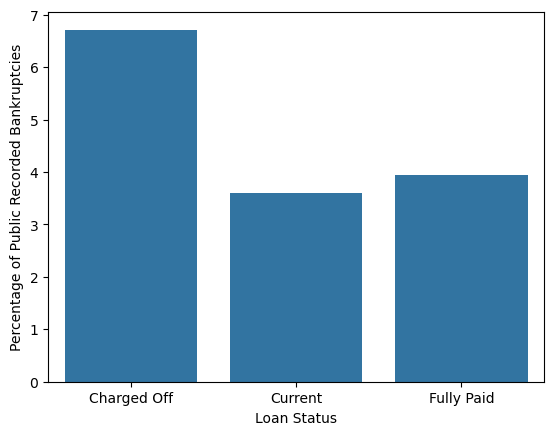

In [33]:
sns.barplot(x=res.index, y=res.values)
plt.ylabel('Percentage of Public Recorded Bankruptcies')
plt.xlabel('Loan Status')
plt.show()

### Finding 1: 
Since the percentage of publicly recorded bankruptcies is almost double in the case of "Charged Off" loans as compared to "Fully Paid",
it can be said that the loans with the status "Current" with 1 or more publicly recorded bankruptcies are more likely to be "Charged Off" than the loans without any bankruptcies

In [34]:
likely_to_default_1 = df[(df.loan_status=='Current') & (df.pub_rec_bankruptcies > 0)]
likely_to_default_1

,loan_amnt,funded_amnt,funded_amnt_inv,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,purpose,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,last_credit_pull_d,pub_rec_bankruptcies,term_in_months,int_rate_in_percent
566,18550,11600,11575.00000,303.60,E,E3,2 years,RENT,45000.0,Verified,Dec-11,Current,debt_consolidation,604xx,IL,21.68,0,Jun-02,2,9,1,18972,65.90%,19,1998.59,1994.24,16080.66,16046.09,9601.41,6479.25,0.00,0.0,0.0,May-16,303.60,May-16,1.0,60,19.42
1794,27700,27700,27700.00000,738.52,E,E5,6 years,MORTGAGE,60000.0,Verified,Dec-11,Current,small_business,976xx,OR,0.32,0,Jun-00,0,3,1,1664,22.20%,9,4849.36,4849.36,39112.44,39112.44,22850.64,16261.80,0.00,0.0,0.0,May-16,738.52,Apr-16,1.0,60,20.30
2937,4200,4200,4200.00000,113.37,F,F1,10+ years,MORTGAGE,78000.0,Not Verified,Nov-11,Current,debt_consolidation,216xx,MD,14.91,0,Dec-00,0,5,1,850,77.30%,9,745.54,745.54,5997.43,5997.43,3454.46,2542.97,0.00,0.0,0.0,May-16,113.37,May-16,1.0,60,20.89
3244,6000,6000,6000.00000,155.75,E,E2,2 years,RENT,38400.0,Verified,Nov-11,Current,other,936xx,CA,20.47,0,Jul-00,1,7,1,3347,83.70%,10,1037.61,1037.61,8225.59,8225.59,4962.40,3263.19,0.00,0.0,0.0,Apr-16,155.75,May-16,1.0,60,19.03
3307,35000,35000,33951.84413,944.71,F,F1,10+ years,MORTGAGE,160000.0,Verified,Nov-11,Current,debt_consolidation,488xx,MI,12.11,0,Jun-99,1,13,2,34165,91.40%,21,5355.36,5340.00,50974.92,48442.03,29644.65,21330.27,0.00,0.0,0.0,May-16,944.71,May-16,2.0,60,20.89
3410,6450,6450,6450.00000,166.05,E,E1,10+ years,OWN,23000.0,Verified,Nov-11,Current,debt_consolidation,735xx,OK,23.17,0,Oct-84,0,3,1,13482,96.30%,6,952.11,952.11,8949.15,8949.15,5497.89,3451.26,0.00,0.0,0.0,May-16,166.05,May-16,1.0,60,18.64
4259,20000,20000,20000.00000,472.14,C,C3,10+ years,MORTGAGE,57600.0,Verified,Nov-11,Current,home_improvement,853xx,AZ,19.73,0,Nov-97,1,19,1,6371,19.30%,32,2716.22,2716.22,25493.40,25493.40,17283.79,8209.61,0.00,0.0,0.0,May-16,472.14,May-16,1.0,60,14.65
4425,14000,14000,14000.00000,349.98,D,D3,10+ years,RENT,77000.0,Not Verified,Nov-11,Current,debt_consolidation,453xx,OH,15.05,0,Apr-74,2,16,1,13825,52.20%,36,2020.25,2020.25,18853.26,18853.26,11979.75,6873.51,0.00,0.0,0.0,May-16,349.98,May-16,1.0,60,17.27
4579,5150,5150,5150.00000,132.58,E,E1,1 year,RENT,34992.0,Source Verified,Nov-11,Current,debt_consolidation,112xx,NY,17.59,0,Jul-01,3,15,1,15187,87.30%,21,761.10,761.10,7143.93,7143.93,4388.90,2755.03,0.00,0.0,0.0,May-16,132.58,Apr-16,1.0,60,18.64
5057,12500,12500,12500.00000,309.12,D,D2,5 years,MORTGAGE,42000.0,Source Verified,Oct-11,Current,debt_consolidation,604xx,IL,19.31,0,Apr-93,3,14,1,13393,55.10%,30,1795.78,1795.78,16635.06,16635.06,10704.22,5930.84,0.00,0.0,0.0,May-16,309.12,May-16,1.0,60,16.77


-------------------- open_acc --------------------
count    39717.000000
mean         9.294408
std          4.400282
min          2.000000
25%          6.000000
50%          9.000000
75%         12.000000
max         44.000000
Name: open_acc, dtype: float64


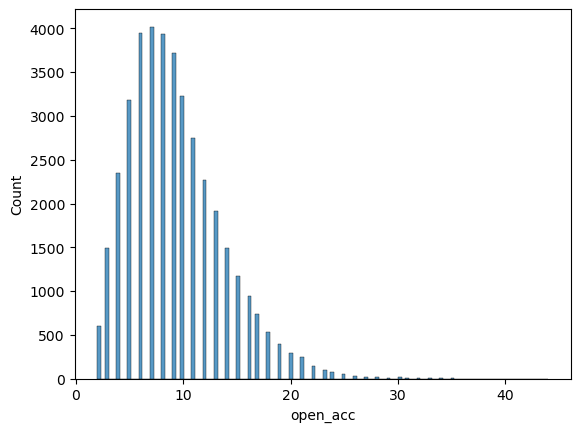

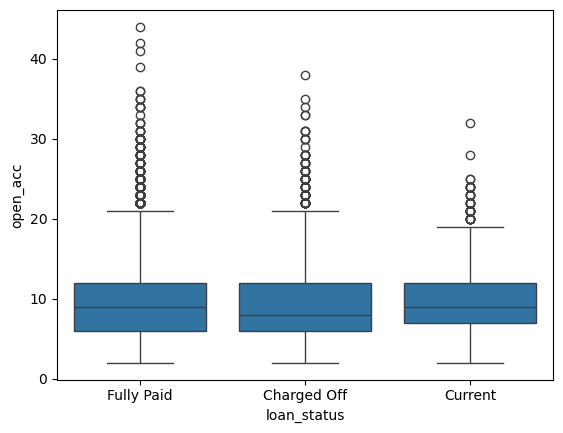

-------------------- total_acc --------------------
count    39717.000000
mean        22.088828
std         11.401709
min          2.000000
25%         13.000000
50%         20.000000
75%         29.000000
max         90.000000
Name: total_acc, dtype: float64


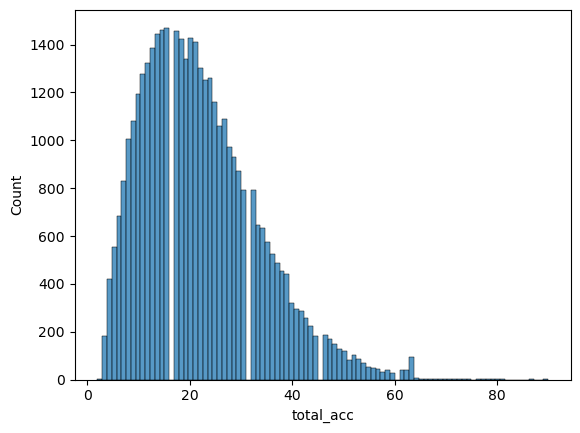

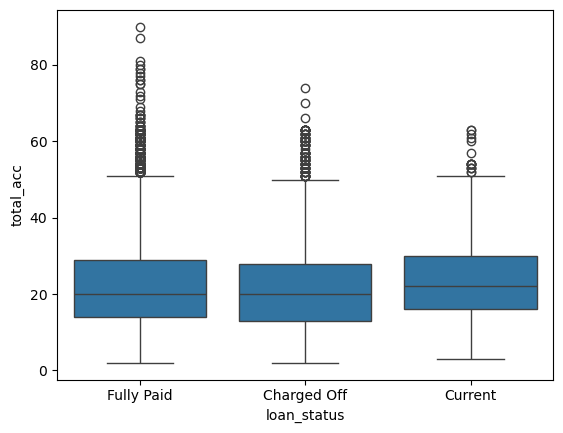

-------------------- int_rate_in_percent --------------------
count    39717.000000
mean        12.021177
std          3.724825
min          5.420000
25%          9.250000
50%         11.860000
75%         14.590000
max         24.590000
Name: int_rate_in_percent, dtype: float64


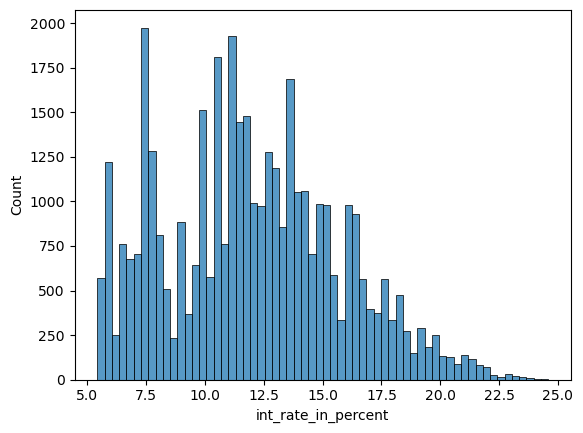

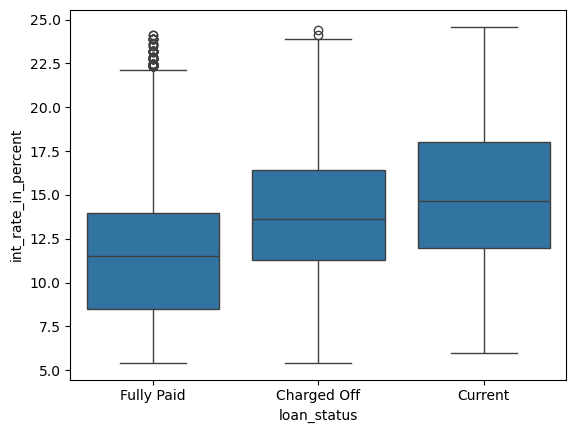

-------------------- loan_amnt --------------------
count    39717.000000
mean     11219.443815
std       7456.670694
min        500.000000
25%       5500.000000
50%      10000.000000
75%      15000.000000
max      35000.000000
Name: loan_amnt, dtype: float64


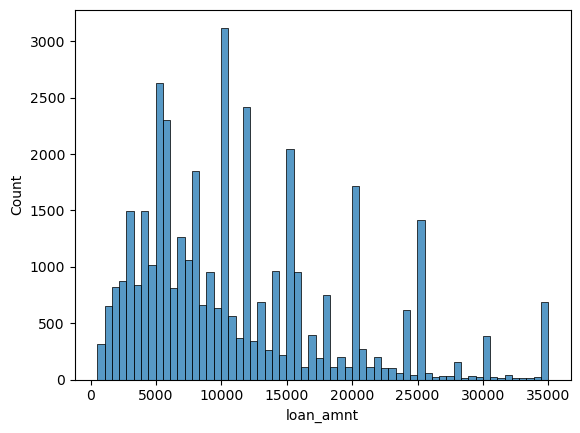

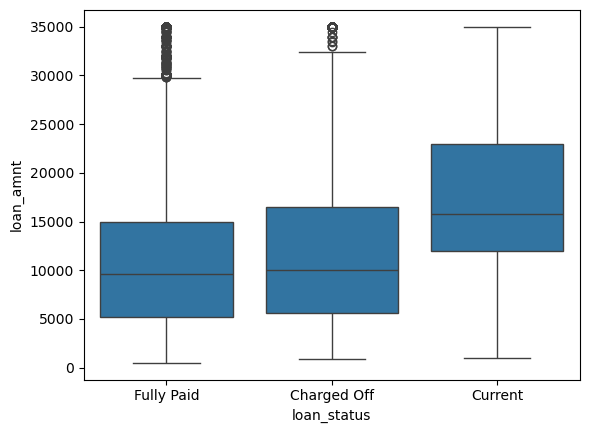

-------------------- funded_amnt --------------------
count    39717.000000
mean     10947.713196
std       7187.238670
min        500.000000
25%       5400.000000
50%       9600.000000
75%      15000.000000
max      35000.000000
Name: funded_amnt, dtype: float64


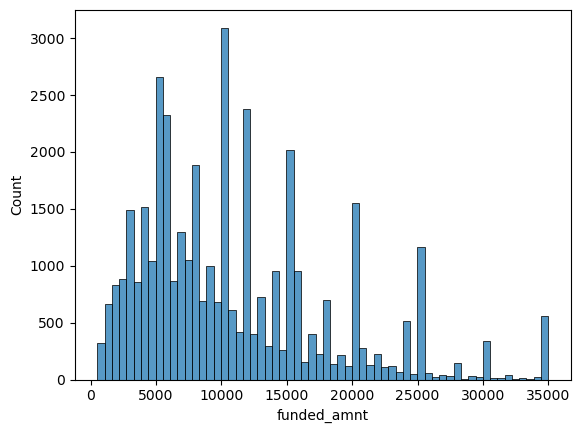

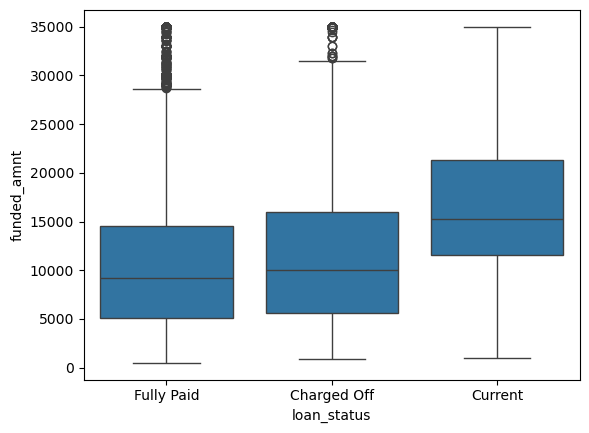

-------------------- annual_inc --------------------
count    3.971700e+04
mean     6.896893e+04
std      6.379377e+04
min      4.000000e+03
25%      4.040400e+04
50%      5.900000e+04
75%      8.230000e+04
max      6.000000e+06
Name: annual_inc, dtype: float64


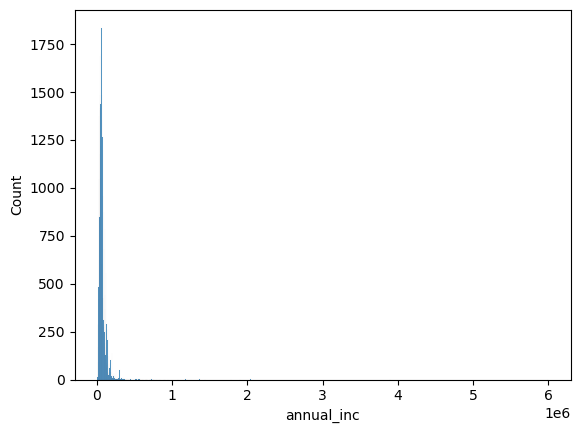

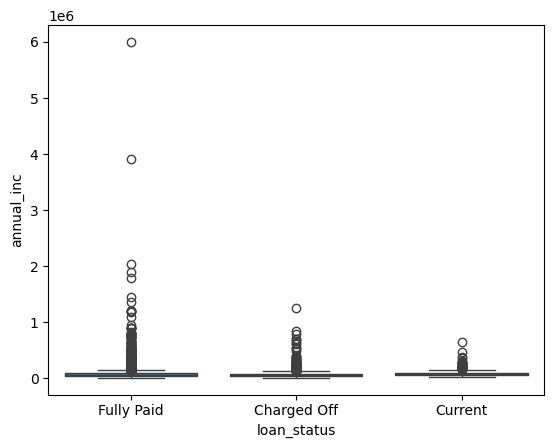

-------------------- total_rec_prncp --------------------
count    39717.000000
mean      9793.348813
std       7065.522127
min          0.000000
25%       4600.000000
50%       8000.000000
75%      13653.260000
max      35000.020000
Name: total_rec_prncp, dtype: float64


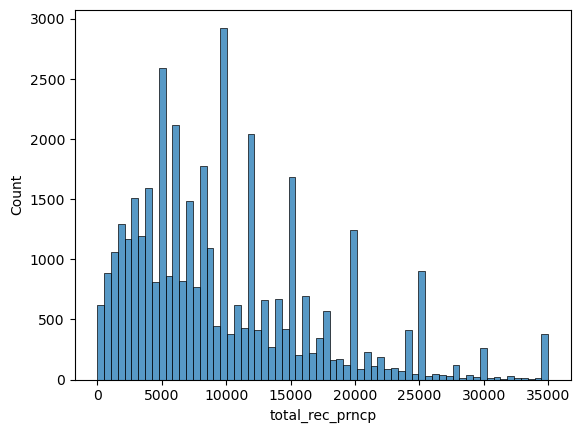

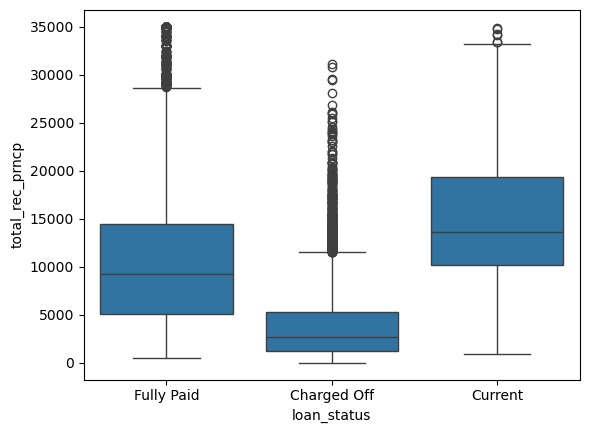

-------------------- funded_amnt_inv --------------------
count    39717.000000
mean     10397.448868
std       7128.450439
min          0.000000
25%       5000.000000
50%       8975.000000
75%      14400.000000
max      35000.000000
Name: funded_amnt_inv, dtype: float64


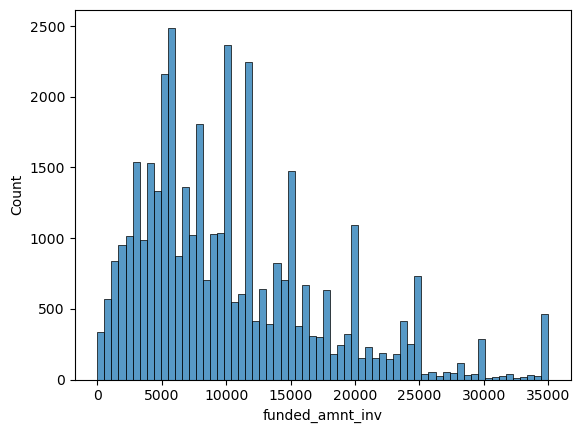

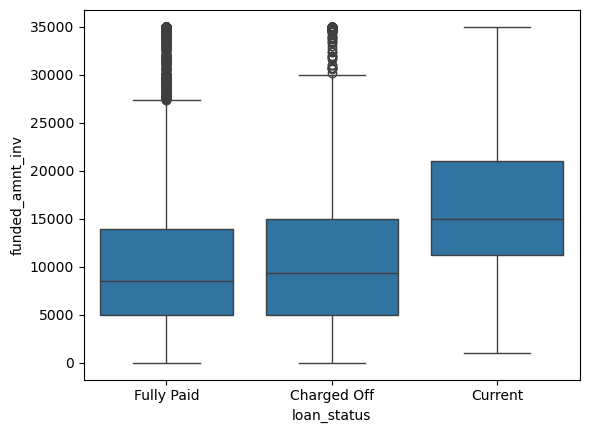

-------------------- installment --------------------
count    39717.000000
mean       324.561922
std        208.874874
min         15.690000
25%        167.020000
50%        280.220000
75%        430.780000
max       1305.190000
Name: installment, dtype: float64


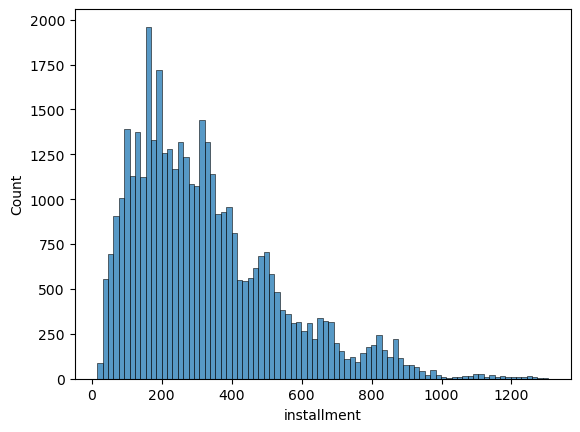

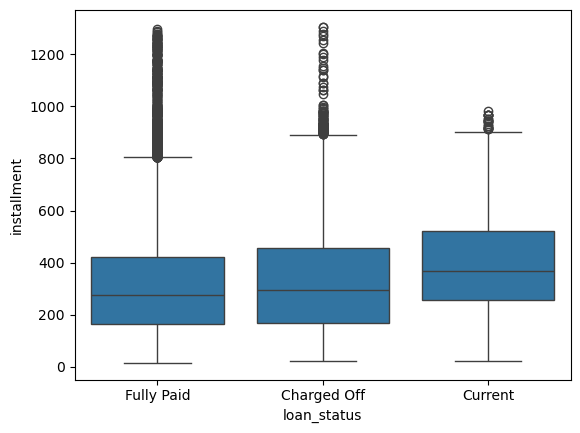

-------------------- revol_bal --------------------
count     39717.000000
mean      13382.528086
std       15885.016641
min           0.000000
25%        3703.000000
50%        8850.000000
75%       17058.000000
max      149588.000000
Name: revol_bal, dtype: float64


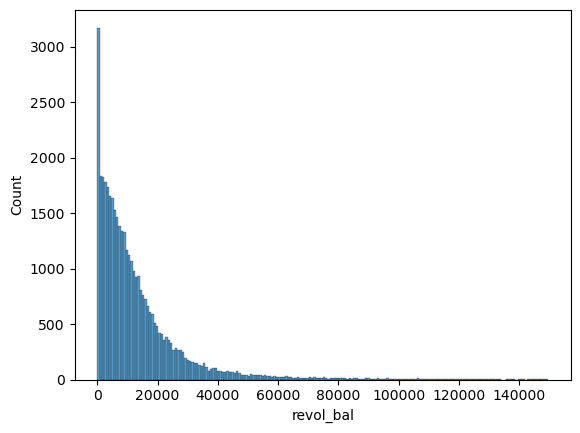

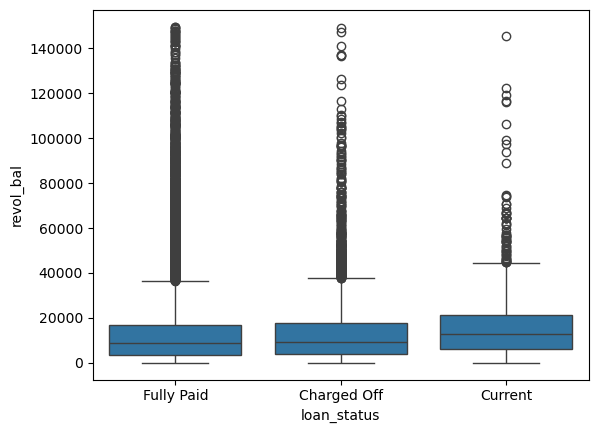

-------------------- last_pymnt_amnt --------------------
count    39717.000000
mean      2678.826162
std       4447.136012
min          0.000000
25%        218.680000
50%        546.140000
75%       3293.160000
max      36115.200000
Name: last_pymnt_amnt, dtype: float64


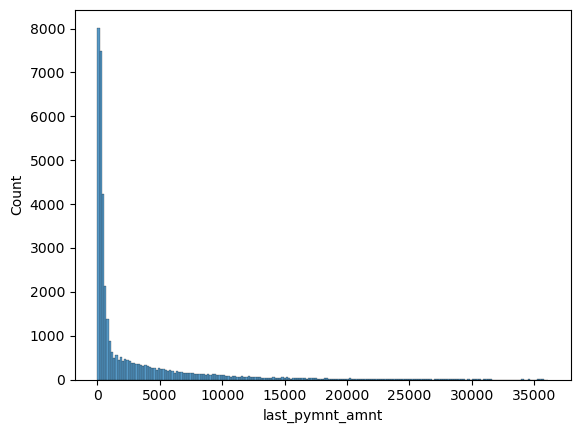

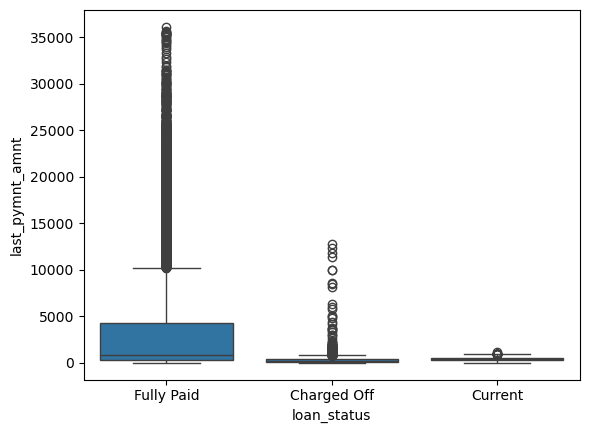

-------------------- total_rec_int --------------------
count    39717.000000
mean      2263.663172
std       2608.111964
min          0.000000
25%        662.180000
50%       1348.910000
75%       2833.400000
max      23563.680000
Name: total_rec_int, dtype: float64


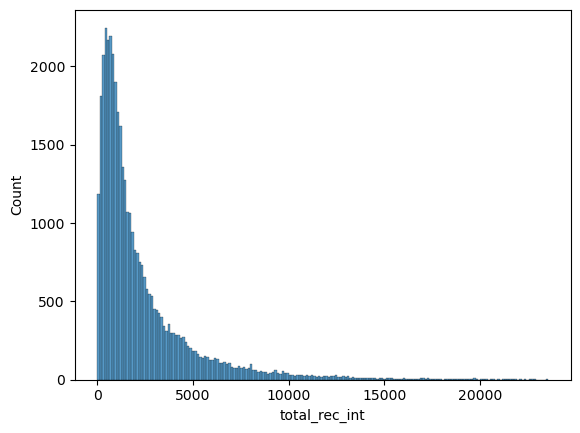

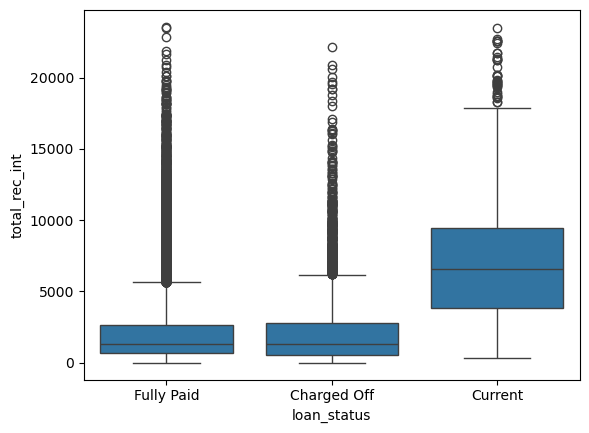

-------------------- total_pymnt_inv --------------------
count    39717.000000
mean     11567.149118
std       8942.672613
min          0.000000
25%       5112.310000
50%       9287.150000
75%      15798.810000
max      58563.680000
Name: total_pymnt_inv, dtype: float64


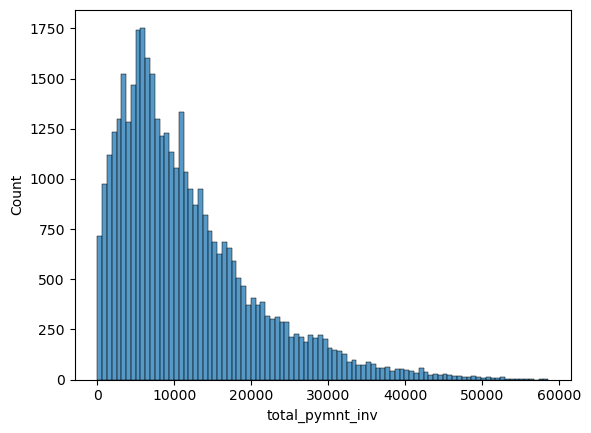

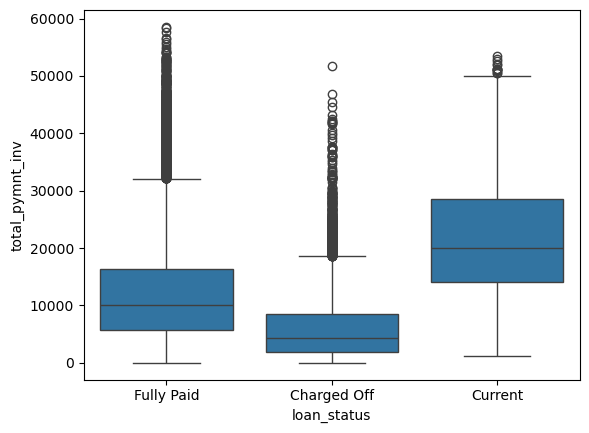

-------------------- total_pymnt --------------------
count    39717.000000
mean     12153.596544
std       9042.040766
min          0.000000
25%       5576.930000
50%       9899.640319
75%      16534.433040
max      58563.679930
Name: total_pymnt, dtype: float64


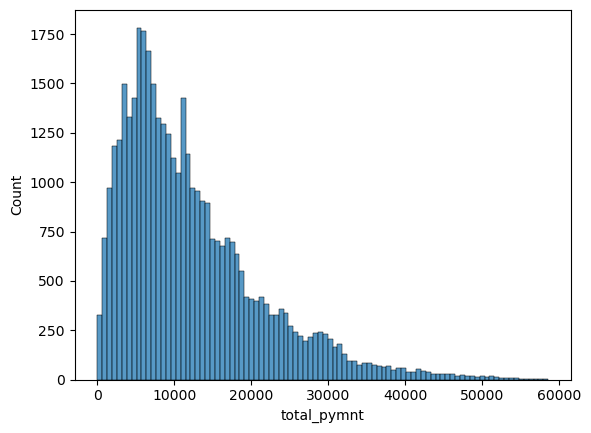

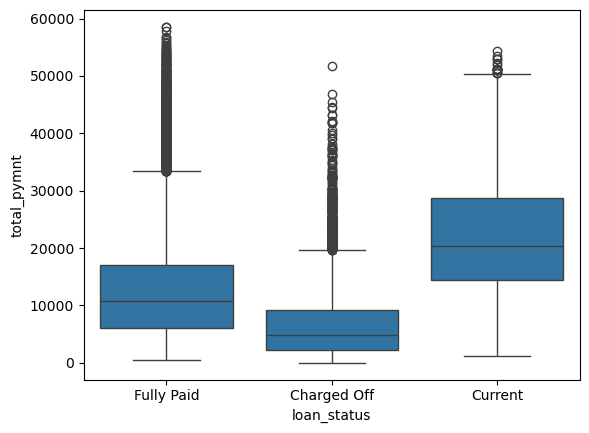

In [35]:
for num in num_cols:
    print('-' * 20, num, '-' * 20)
    print (df[num].describe())
    sns.histplot(df, x=num)
    plt.show()
    sns.boxplot(df, x='loan_status', y=num)
    plt.show()

In [36]:
df['percent_total_pymnt_inv'] = (df['total_pymnt_inv']/df['total_pymnt'])*100
df['percent_funded_amnt_inv'] = (df['funded_amnt_inv']/df['funded_amnt'])*100

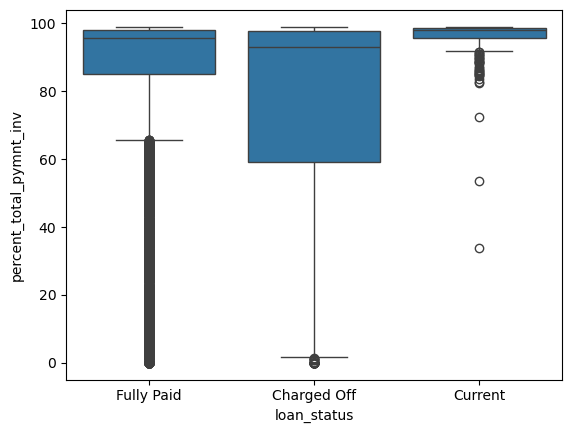

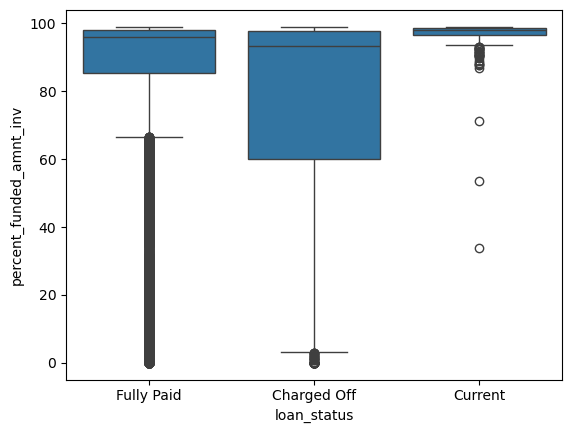

In [37]:
sns.boxplot(df[df.percent_total_pymnt_inv<99], x='loan_status', y='percent_total_pymnt_inv')
plt.show()
sns.boxplot(df[df.percent_funded_amnt_inv<99], x='loan_status', y='percent_funded_amnt_inv')
plt.show()

## Finding 2
for loans given where total amount paid or promised by investor is less, is more likely to be "Charged Off" as compared to "Fully Paid"

In [38]:
df[(df.loan_status=='Charged Off') & (df.percent_total_pymnt_inv<99)].percent_total_pymnt_inv.describe()

count    1570.000000
mean       75.496994
std        30.915319
min         0.000000
25%        59.279848
50%        92.996987
75%        97.702556
max        98.999475
Name: percent_total_pymnt_inv, dtype: float64

In [39]:
df[(df.loan_status=='Charged Off') & (df.percent_funded_amnt_inv<99)].percent_funded_amnt_inv.describe()

count    1567.000000
mean       75.945422
std        31.139907
min         0.000000
25%        59.900811
50%        93.251952
75%        97.704290
max        98.994200
Name: percent_funded_amnt_inv, dtype: float64

In [40]:
q1 = df[(df.loan_status=='Charged Off') & (df.percent_total_pymnt_inv<99)].percent_total_pymnt_inv.quantile(0.5)
q2 = df[(df.loan_status=='Charged Off') & (df.percent_funded_amnt_inv<99)].percent_funded_amnt_inv.quantile(0.5)
likely_to_default_2 = df[(df.loan_status=='Current') & ((df.percent_total_pymnt_inv < q1) | (df.percent_funded_amnt_inv < q2))]
likely_to_default_2

,loan_amnt,funded_amnt,funded_amnt_inv,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,purpose,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,last_credit_pull_d,pub_rec_bankruptcies,term_in_months,int_rate_in_percent,percent_total_pymnt_inv,percent_funded_amnt_inv
335,20000,20000,18626.346740,494.59,D,D2,7 years,RENT,50000.0,Verified,Dec-11,Current,credit_card,622xx,IL,22.82,0,Mar-95,1,12,0,16565,56.70%,22,3730.24,3725.49,25695.80,22711.23,16269.76,9426.04,0.00000,0.0,0.0,Apr-16,494.59,May-16,0.0,60,16.77,88.384989,93.131734
338,20000,20000,18847.373060,451.90,B,B5,7 years,OWN,85000.0,Source Verified,Dec-11,Current,home_improvement,707xx,LA,10.21,0,Oct-02,0,13,0,17537,54.80%,31,3467.10,3467.10,23468.38,21380.62,16532.90,6935.48,0.00000,0.0,0.0,Apr-16,451.90,May-16,0.0,60,12.69,91.103945,94.236865
367,17000,17000,16060.110690,406.85,C,C4,8 years,RENT,65000.0,Not Verified,Dec-11,Current,debt_consolidation,076xx,NJ,16.84,0,Nov-98,2,11,0,12923,62.70%,16,2733.54,2733.54,21554.79,19635.43,14266.46,7267.99,20.34000,0.0,0.0,May-16,406.85,May-16,0.0,60,15.27,91.095436,94.471239
417,25975,16475,15252.506790,372.25,B,B5,10+ years,MORTGAGE,130000.0,Verified,Dec-11,Current,debt_consolidation,173xx,PA,26.13,0,Jun-83,0,15,0,93718,77.20%,29,2851.40,2847.01,19342.55,17144.26,13623.60,5718.95,0.00000,0.0,0.0,Apr-16,372.25,May-16,0.0,60,12.69,88.634952,92.579707
431,35000,35000,32763.055200,916.03,E,E3,8 years,RENT,195000.0,Verified,Dec-11,Current,debt_consolidation,981xx,WA,11.72,0,Jan-96,2,17,0,29573,66.10%,27,88.54,88.43,54427.23,48913.25,34911.47,19515.76,0.00000,0.0,0.0,May-16,916.03,May-16,0.0,60,19.42,89.869078,93.608729
8076,12000,12000,10975.000000,260.85,B,B3,< 1 year,MORTGAGE,156000.0,Source Verified,Sep-11,Current,home_improvement,773xx,TX,13.38,0,Nov-03,0,12,0,12007,41.80%,26,1033.65,946.32,14586.72,13339.30,10966.35,3620.37,0.00000,0.0,0.0,May-16,260.85,May-16,0.0,60,10.99,91.448249,91.458333
9296,3250,3250,3000.000000,73.94,C,C1,9 years,MORTGAGE,45000.0,Source Verified,Aug-11,Current,debt_consolidation,450xx,OH,24.59,0,Mar-95,0,15,1,26732,85.40%,25,296.24,274.01,4125.85,3807.56,2953.76,1172.09,0.00000,0.0,0.0,May-16,73.94,May-16,1.0,60,12.99,92.285468,92.307692
9730,25000,25000,21898.127350,549.69,B,B4,10+ years,MORTGAGE,96660.0,Verified,Aug-11,Current,debt_consolidation,935xx,CA,20.09,0,Feb-88,0,20,0,29034,20.50%,34,1642.70,1624.59,31292.72,26199.32,23357.31,7935.41,0.00000,0.0,0.0,May-16,549.69,May-16,0.0,60,11.49,83.723371,87.592509
9745,16000,16000,14998.916260,368.08,C,C2,3 years,RENT,52000.0,Not Verified,Aug-11,Current,debt_consolidation,113xx,NY,6.76,0,Mar-95,0,5,0,6038,46.10%,29,1096.03,1079.13,20972.07,19263.77,14903.98,6049.74,18.35551,0.0,0.0,May-16,368.08,May-16,0.0,60,13.49,91.854404,93.743227
9755,34000,34000,32193.008670,878.06,E,E3,10+ years,MORTGAGE,151000.0,Verified,Aug-11,Current,debt_consolidation,173xx,PA,4.82,0,Feb-94,0,4,0,17635,80.20%,10,2591.71,2572.70,50007.91,46014.29,31408.29,18599.62,0.00000,0.0,0.0,May-16,878.06,May-16,0.0,60,18.79,92.014023,94.685320


## Finding 3
interest rate in percent is higher in case of "Charged Off", which means, higher interest loan rates are more likely to be "Charged Off"

In [41]:
q = df[df.loan_status=='Charged Off'].int_rate_in_percent.quantile(0.95)
q

20.16

In [42]:
likely_to_default_3 = df[(df.loan_status=='Current') & (df.int_rate_in_percent > q)]
likely_to_default_3

,loan_amnt,funded_amnt,funded_amnt_inv,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,purpose,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,last_credit_pull_d,pub_rec_bankruptcies,term_in_months,int_rate_in_percent,percent_total_pymnt_inv,percent_funded_amnt_inv
95,15300,15300,15275.00000,423.10,F,F4,6 years,RENT,85000.0,Verified,Dec-11,Current,credit_card,226xx,VA,20.58,0,Feb-84,2,14,0,26524,89.70%,27,3125.79,3120.68,21988.20,21952.28,12174.21,9813.99,0.0,0.0,0.0,May-16,423.10,May-16,0.0,60,22.06,99.836640,99.836601
540,13000,13000,13000.00000,370.38,G,G3,10+ years,RENT,61000.0,Source Verified,Dec-11,Current,debt_consolidation,100xx,NY,11.65,0,Mar-97,1,10,0,18427,92.10%,14,2410.09,2410.09,19604.66,19604.66,10589.91,9014.75,0.0,0.0,0.0,May-16,370.38,May-16,0.0,60,23.52,100.000000,100.000000
840,20000,20000,19975.00000,533.23,E,E5,5 years,MORTGAGE,51750.0,Verified,Dec-11,Current,debt_consolidation,073xx,NJ,18.97,0,Jun-97,0,18,0,19557,92.50%,29,3506.46,3502.02,28228.43,28193.27,16493.54,11734.89,0.0,0.0,0.0,May-16,533.23,Apr-16,0.0,60,20.30,99.875445,99.875000
856,30000,18550,18550.00000,494.57,E,E5,8 years,RENT,75000.0,Source Verified,Dec-11,Current,debt_consolidation,342xx,FL,18.77,0,Jun-00,0,11,0,16788,71.40%,15,3247.37,3247.37,26192.71,26192.71,15302.64,10890.07,0.0,0.0,0.0,May-16,494.57,May-16,0.0,60,20.30,100.000000,100.000000
919,30000,30000,29092.57163,822.95,F,F3,2 years,RENT,85000.0,Verified,Dec-11,Current,debt_consolidation,100xx,NY,11.44,0,Sep-02,2,9,0,23760,97.30%,20,5376.49,5371.96,43591.91,41215.79,24623.51,18968.40,0.0,0.0,0.0,May-16,822.95,May-16,0.0,60,21.67,94.549172,96.975239
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14314,20000,20000,19975.00000,532.67,F,F1,6 years,RENT,72000.0,Verified,May-11,Current,small_business,802xx,CO,8.72,0,Mar-05,2,3,0,7688,84.40%,5,531.03,530.28,31411.21,31372.11,19468.97,11942.24,0.0,0.0,0.0,May-16,532.67,May-16,0.0,60,20.25,99.875522,99.875000
14615,16000,16000,15800.00000,436.11,F,F4,4 years,MORTGAGE,78000.0,Source Verified,May-11,Current,debt_consolidation,735xx,OK,23.18,0,Aug-91,0,9,0,35331,94.50%,23,433.23,427.72,25718.01,25396.74,15566.77,10151.24,0.0,0.0,0.0,May-16,436.11,May-16,0.0,60,21.36,98.750798,98.750000
14765,6000,6000,6000.00000,161.05,F,F2,10+ years,RENT,36000.0,Verified,Jun-11,Current,small_business,190xx,PA,2.33,0,Nov-03,0,5,0,692,5.30%,10,160.84,160.84,9494.59,9494.59,5839.17,3655.42,0.0,0.0,0.0,May-16,161.05,May-16,0.0,60,20.62,100.000000,100.000000
14934,18000,18000,18000.00000,490.62,F,F4,1 year,MORTGAGE,44250.0,Source Verified,May-11,Current,wedding,770xx,TX,13.34,1,Oct-04,1,18,0,2516,16.70%,34,484.42,484.42,28939.86,28939.86,17515.61,11424.25,0.0,0.0,0.0,May-16,490.62,May-16,0.0,60,21.36,100.000000,100.000000


In [43]:
second_cat_cols = ['term_in_months', 'verification_status', 'loan_status', 'home_ownership',
            'grade', 'emp_length', 'purpose']

-------------------- term_in_months --------------------


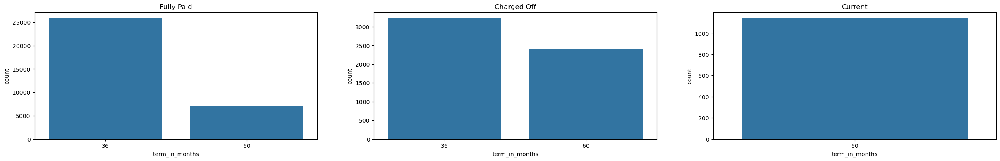

-------------------- verification_status --------------------


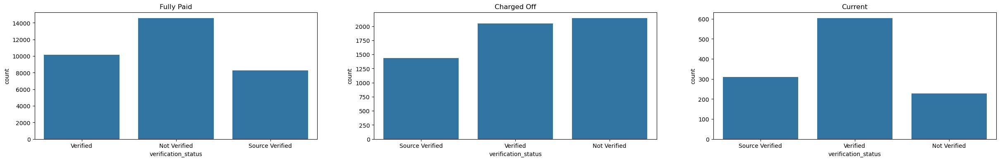

-------------------- loan_status --------------------


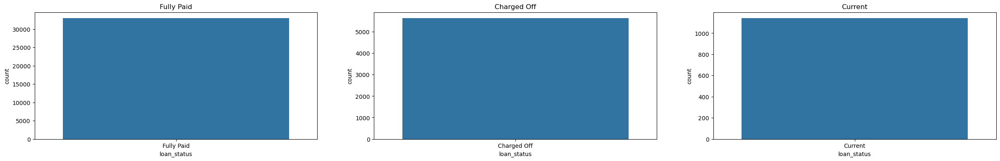

-------------------- home_ownership --------------------


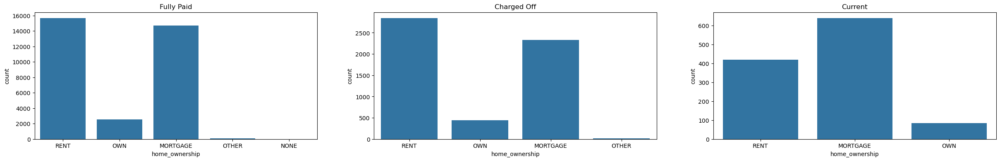

-------------------- grade --------------------


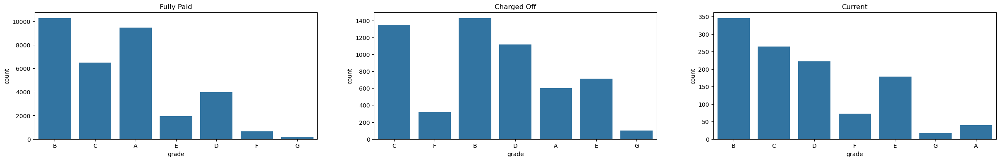

-------------------- emp_length --------------------


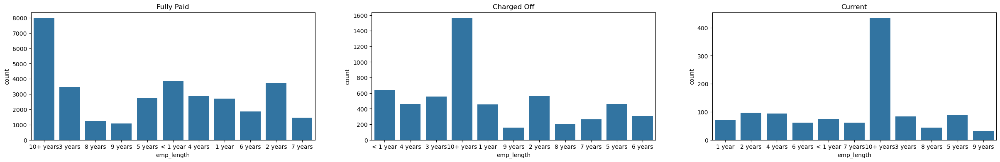

-------------------- purpose --------------------


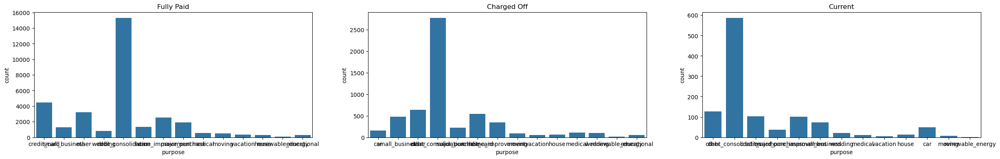

In [44]:
for col in second_cat_cols:
    print('-' * 20, col, '-' * 20)
    fig, axes = plt.subplots(1, 3, figsize=(30, 4))
    sns.countplot(data=df[df.loan_status=="Fully Paid"], x=col, ax=axes[0])
    axes[0].set_title('Fully Paid')
    sns.countplot(data=df[df.loan_status=="Charged Off"], x=col, ax=axes[1])
    axes[1].set_title('Charged Off')
    sns.countplot(data=df[df.loan_status=="Current"], x=col, ax=axes[2])
    axes[2].set_title('Current')
    plt.show()

## Finding 4
long term loans (60 months) are more likely to be "Charged Off"

In [45]:
second_cat_cols = ['verification_status', 'home_ownership', 'grade', 'emp_length', 'purpose']

-------------------- verification_status --------------------


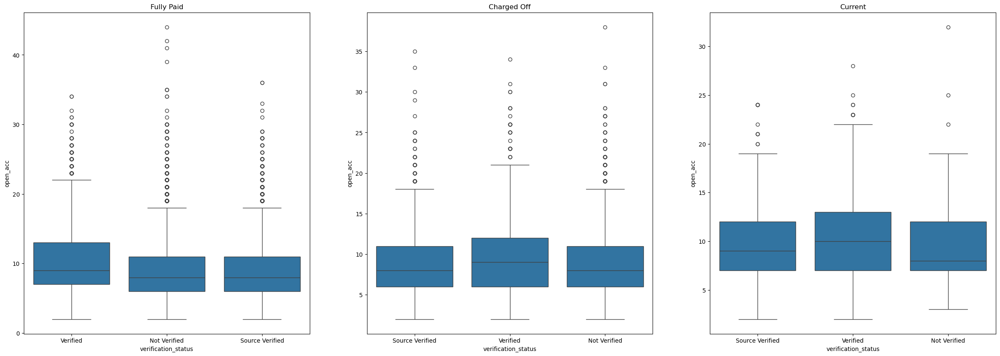

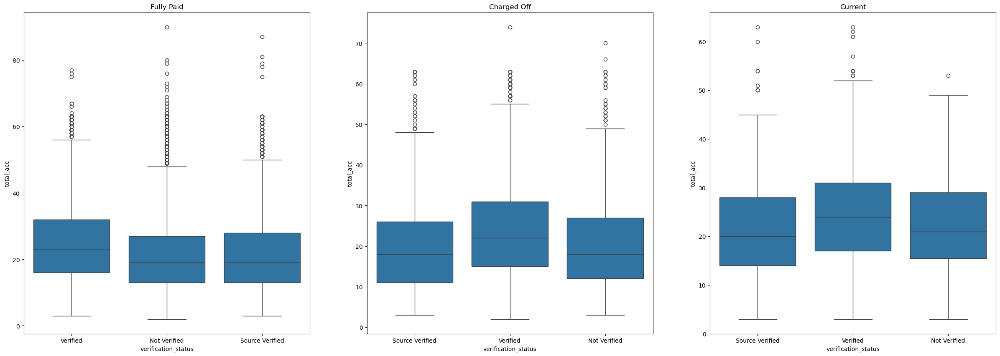

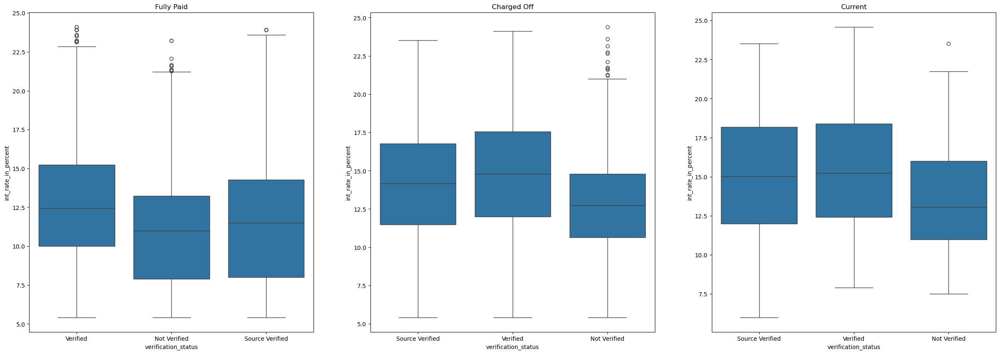

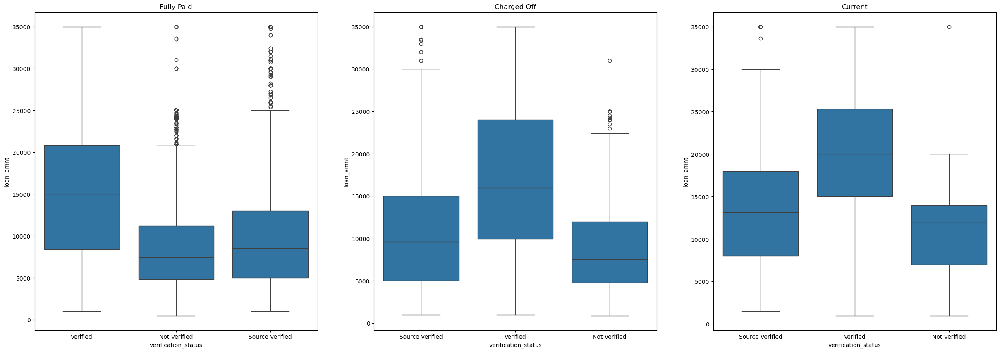

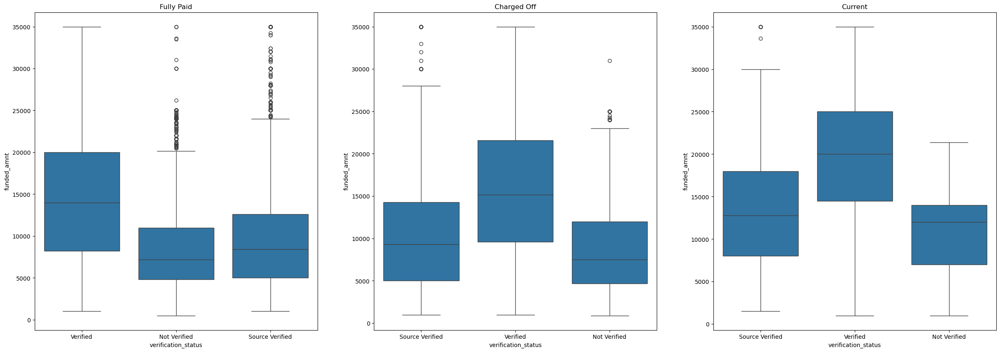

...

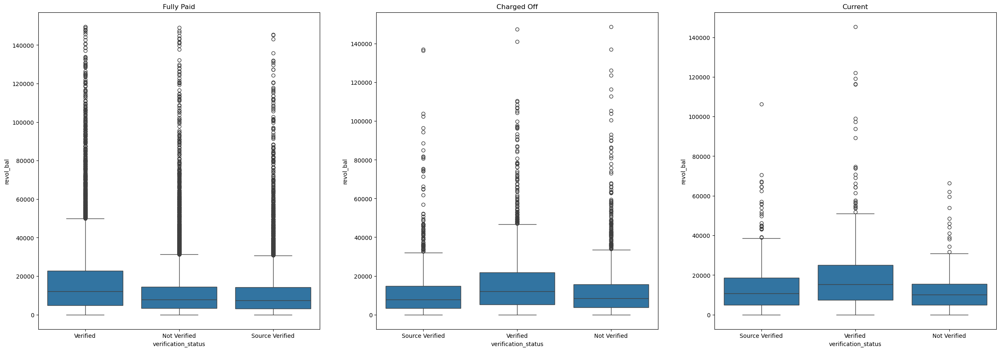

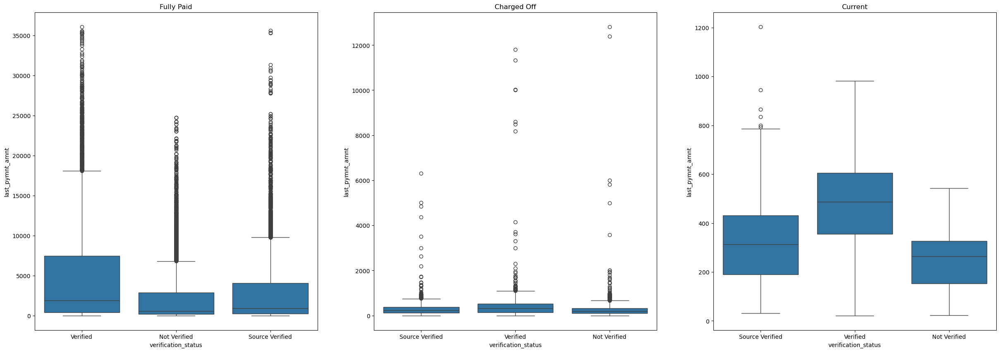

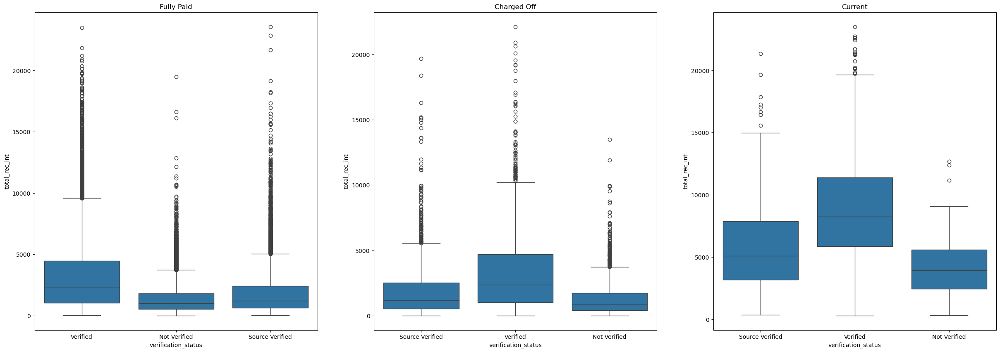

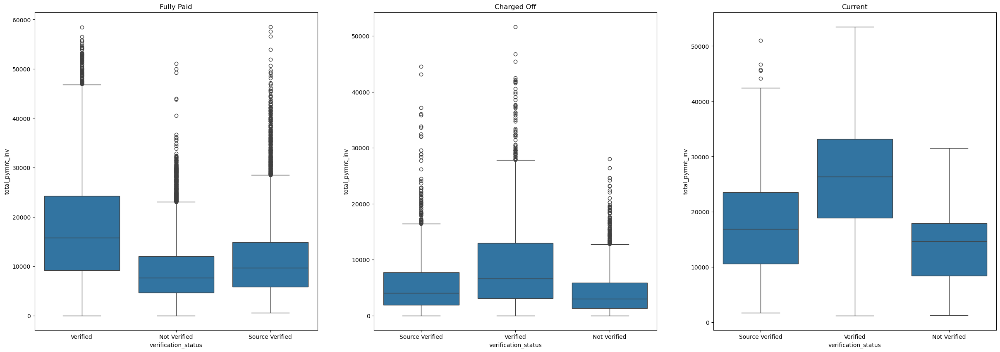

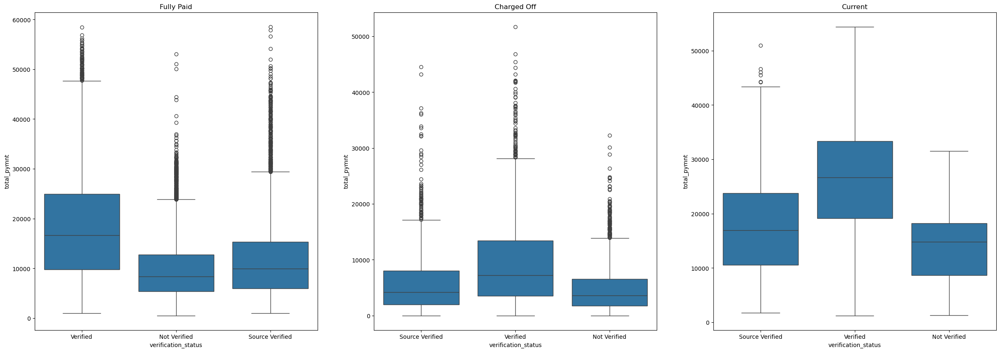

-------------------- home_ownership --------------------


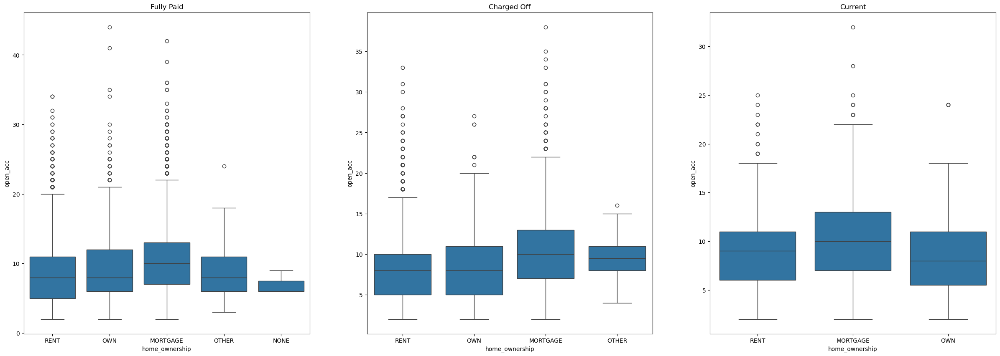

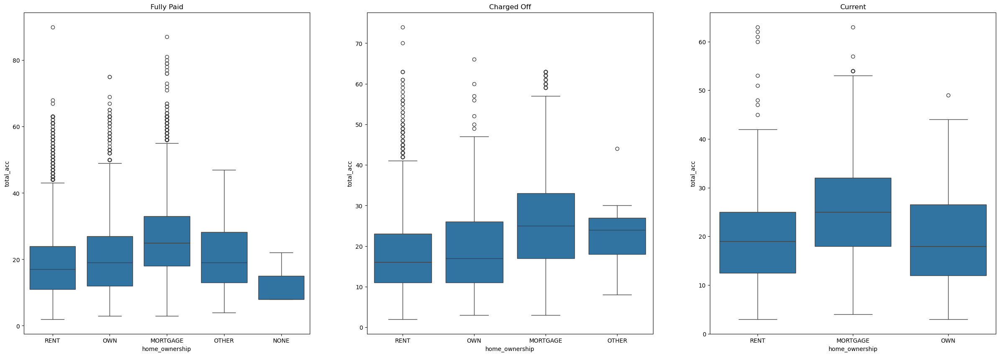

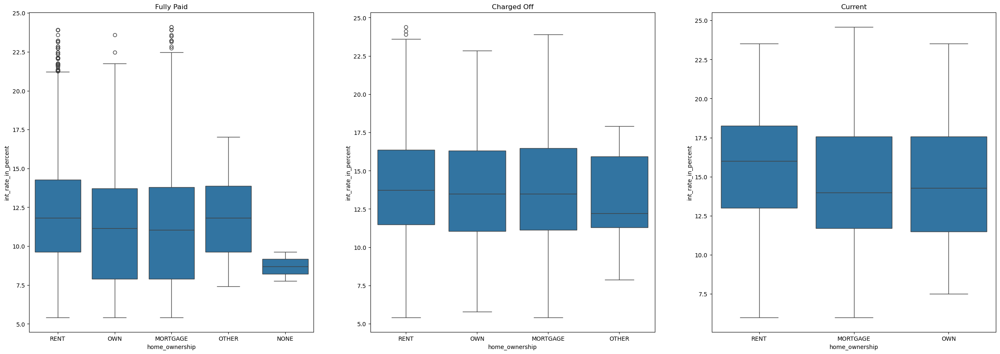

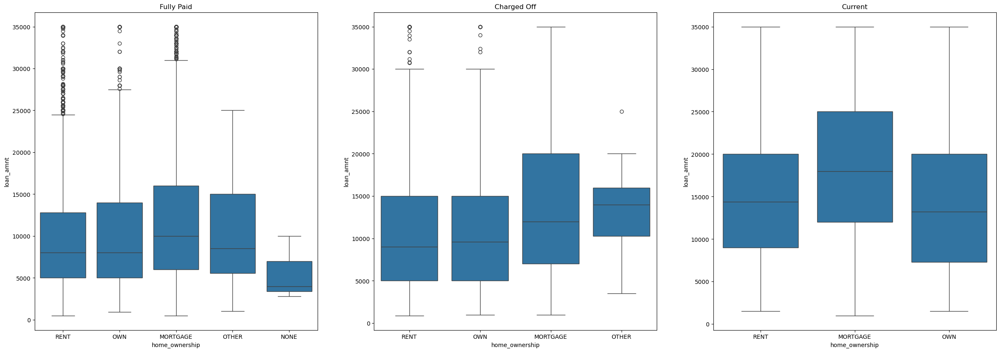

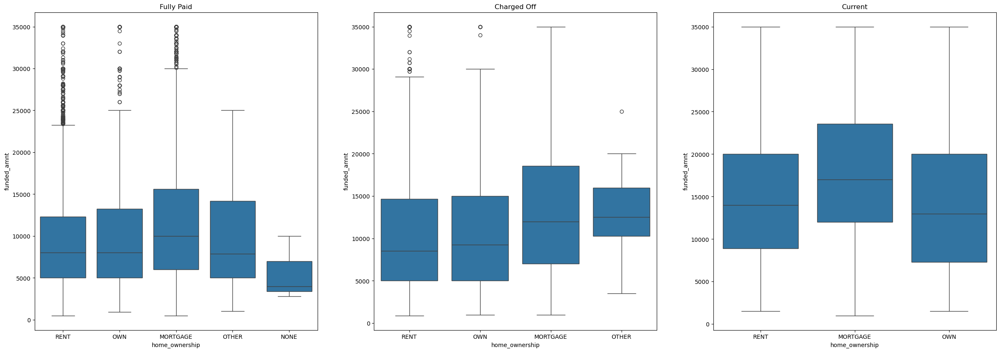

...

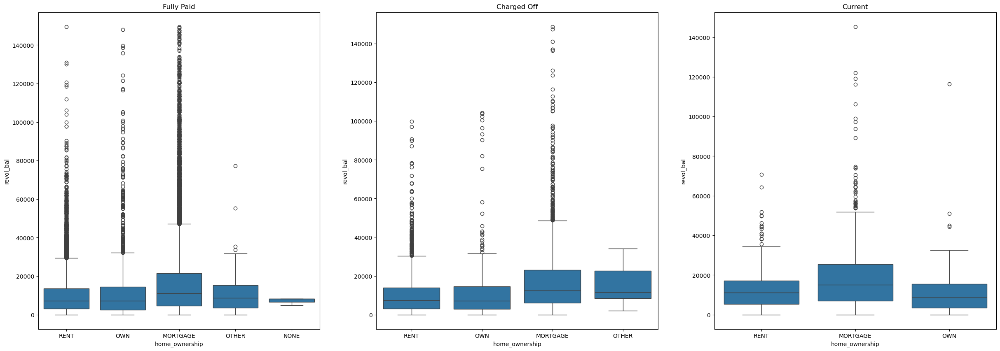

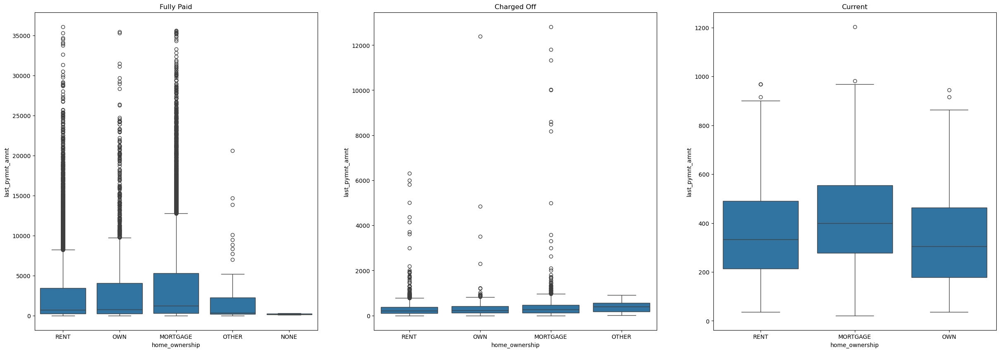

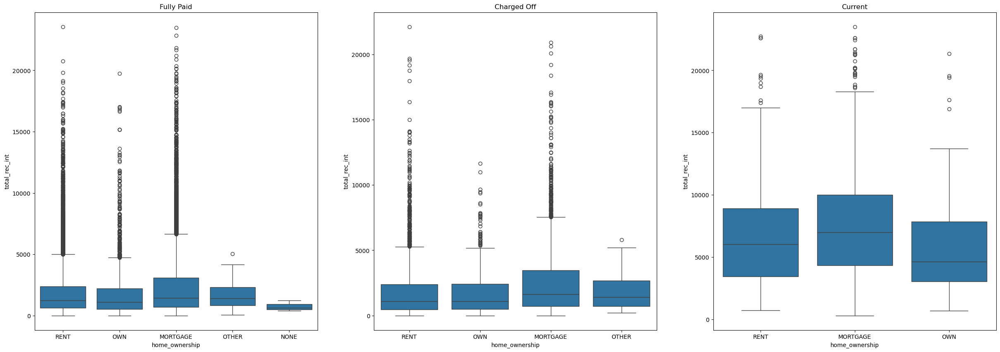

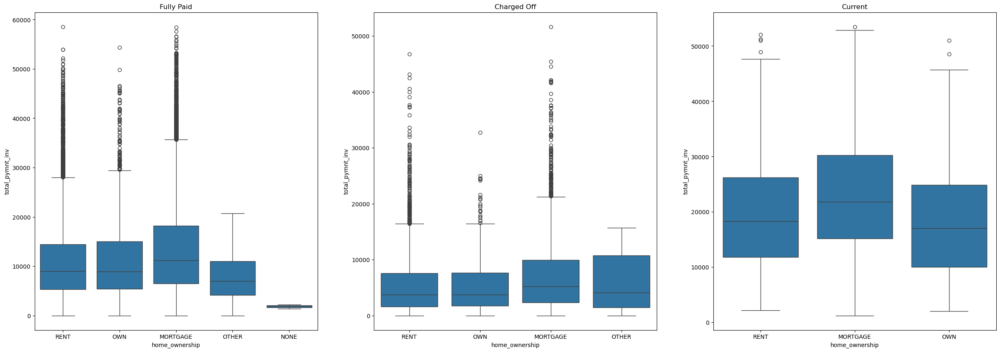

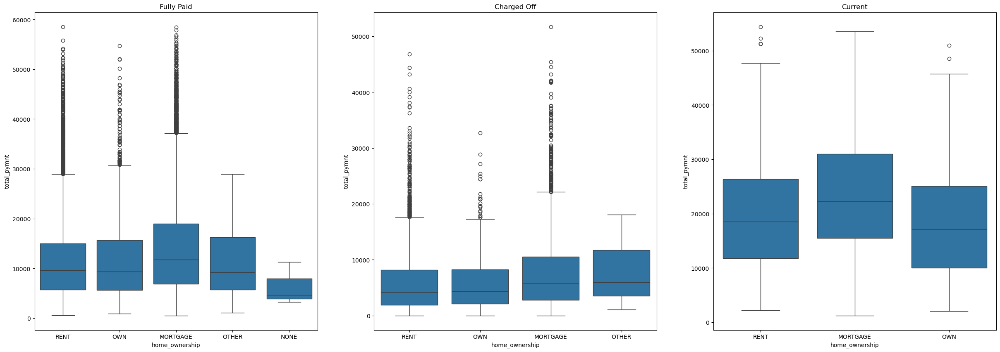

-------------------- grade --------------------


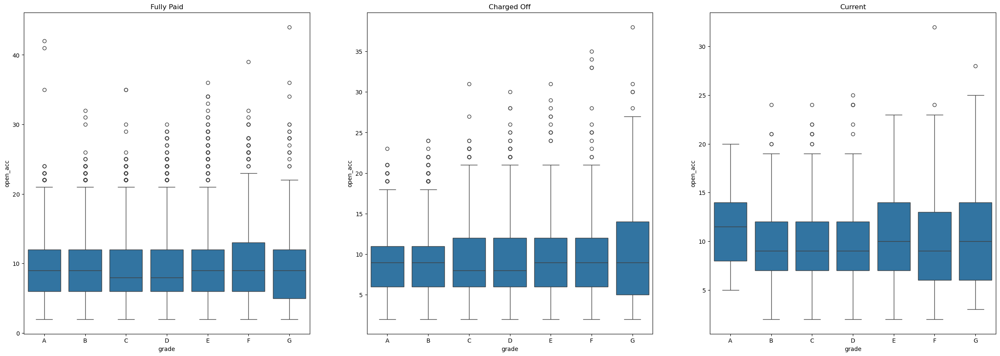

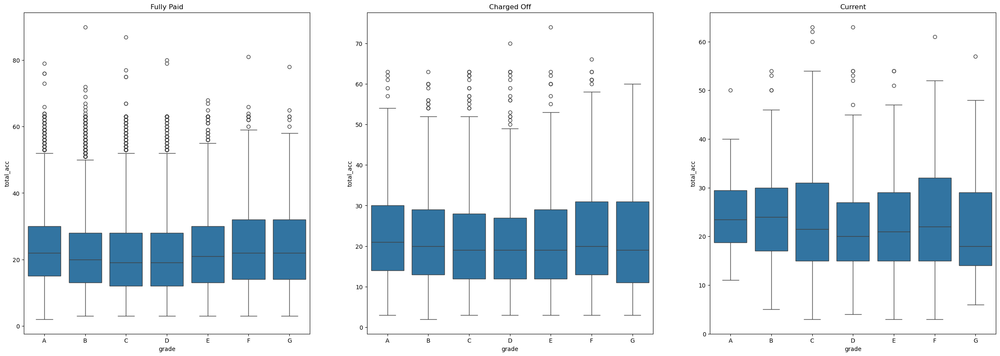

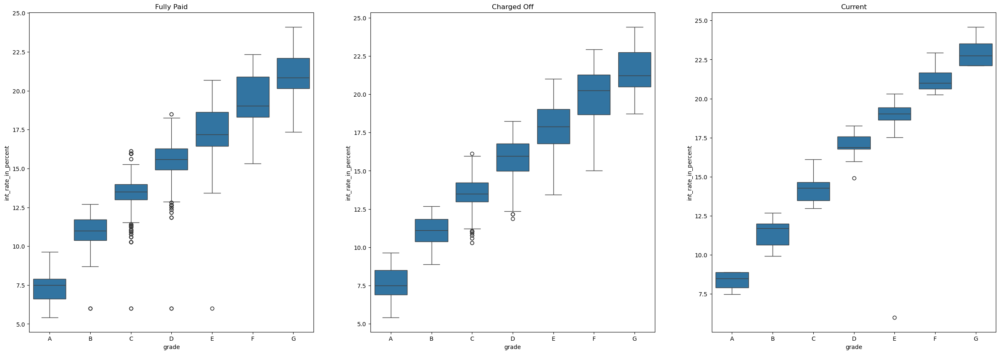

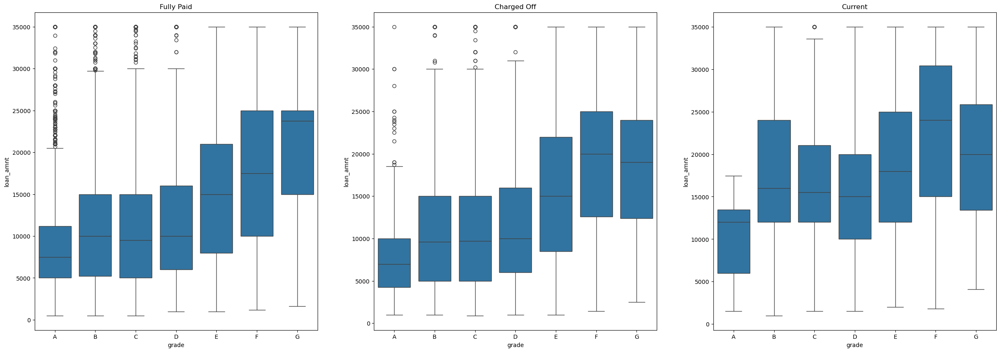

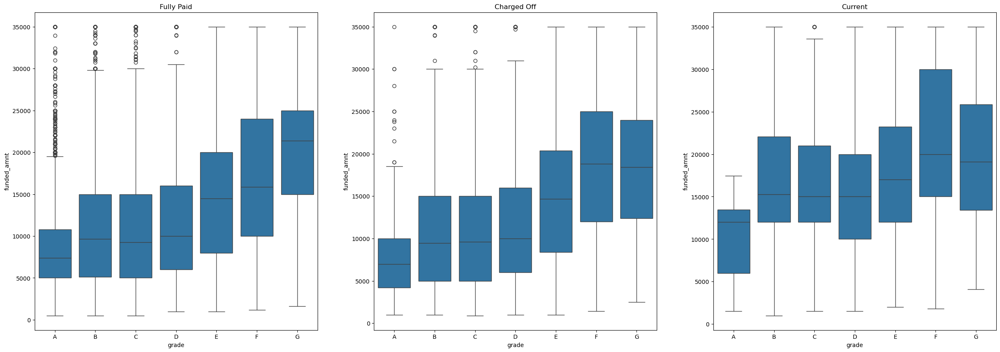

...

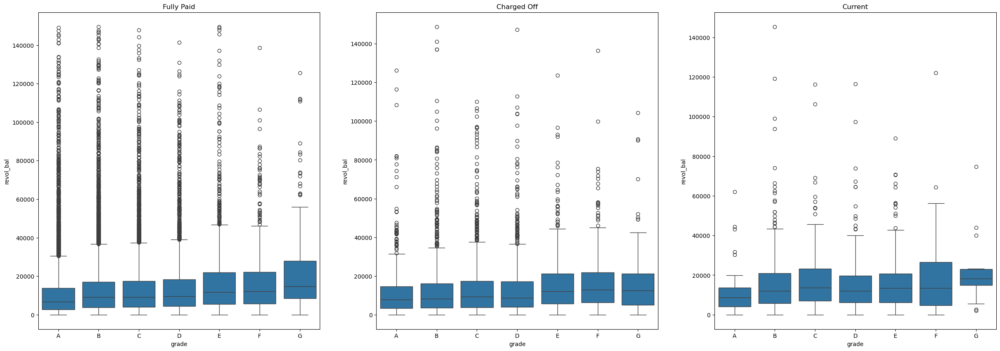

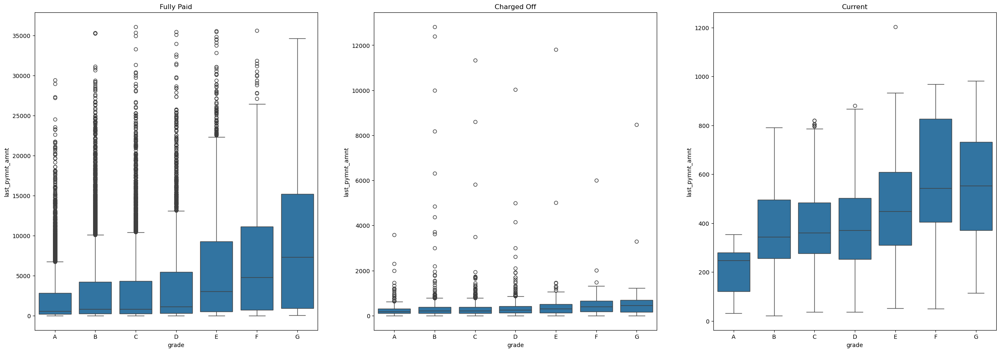

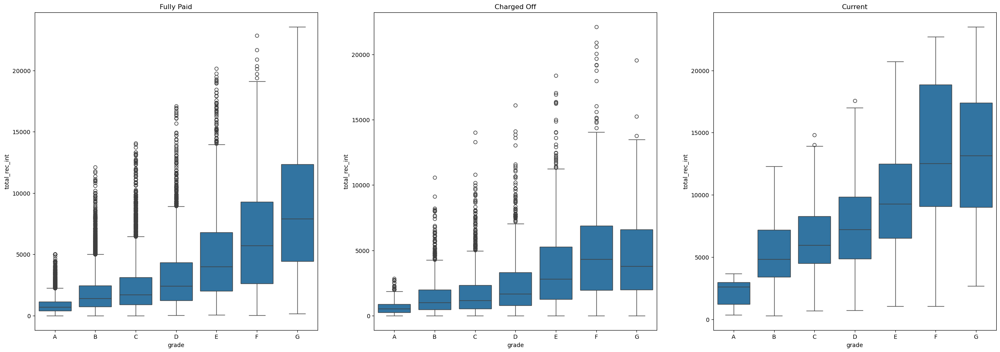

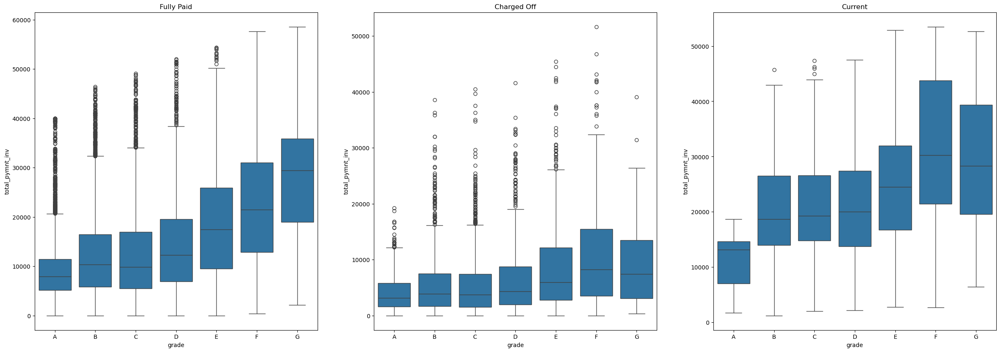

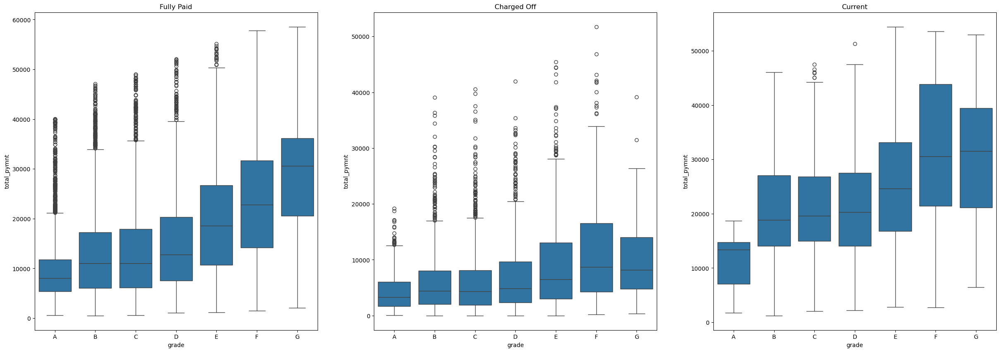

-------------------- emp_length --------------------


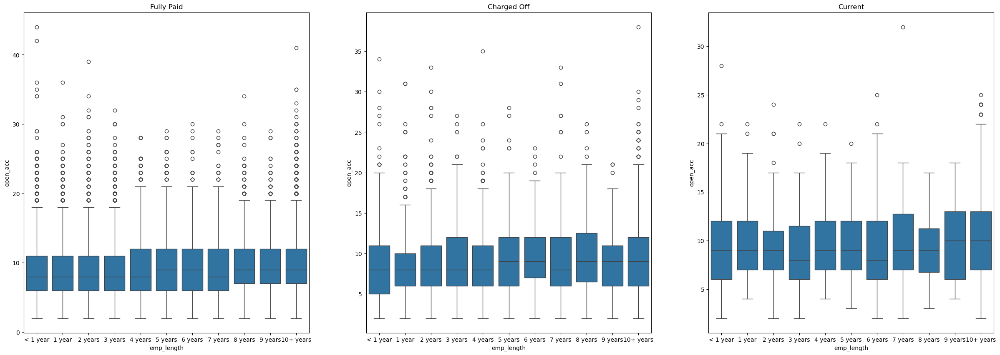

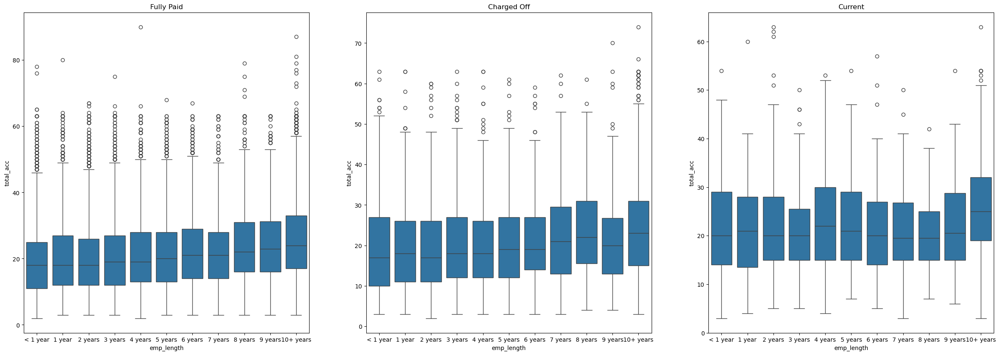

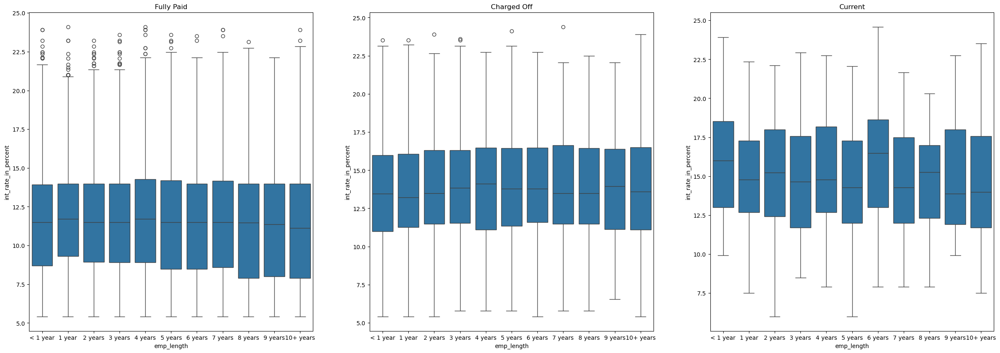

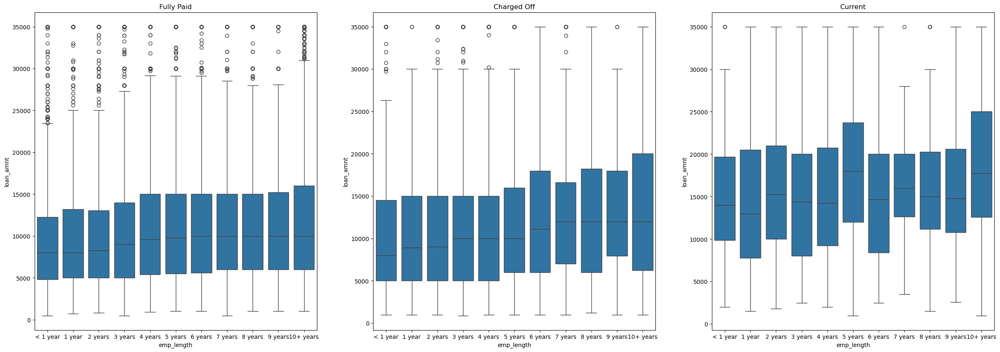

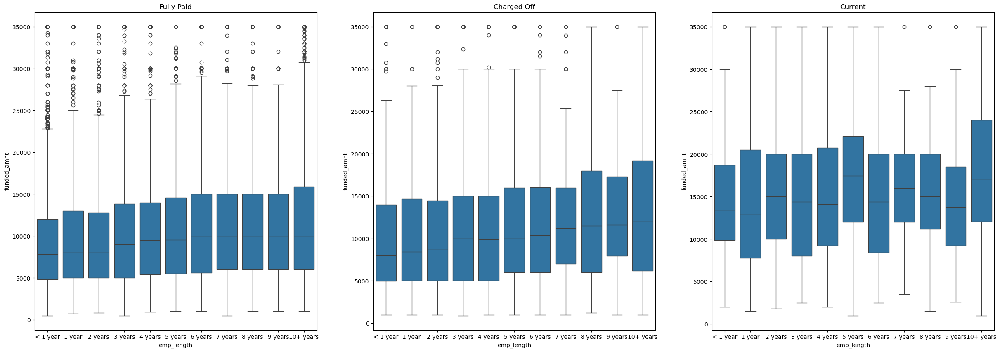

...

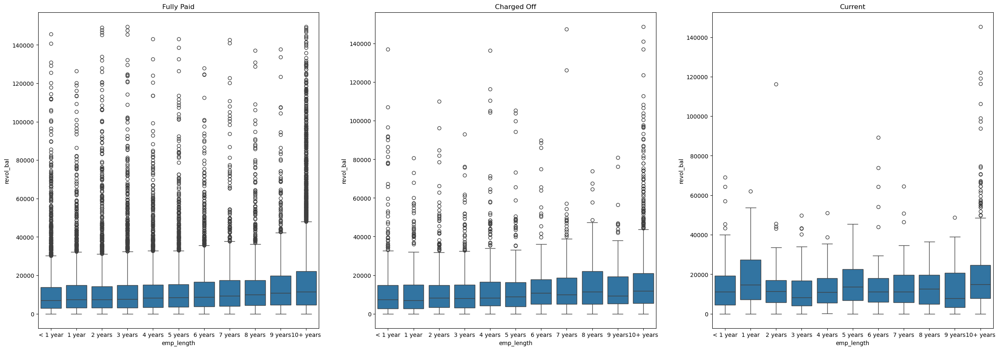

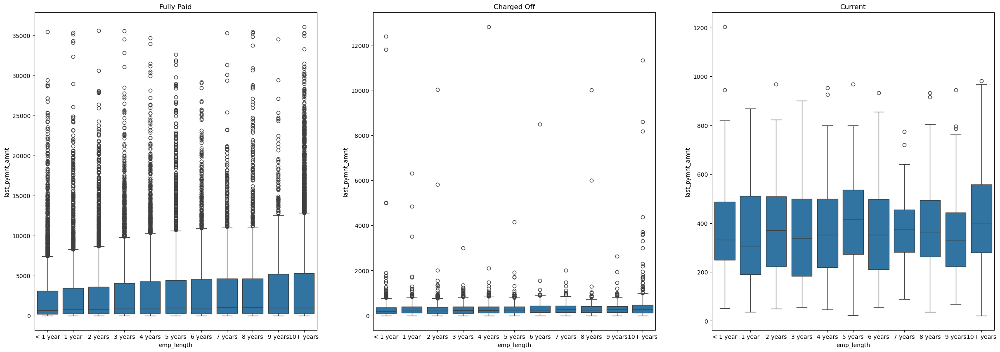

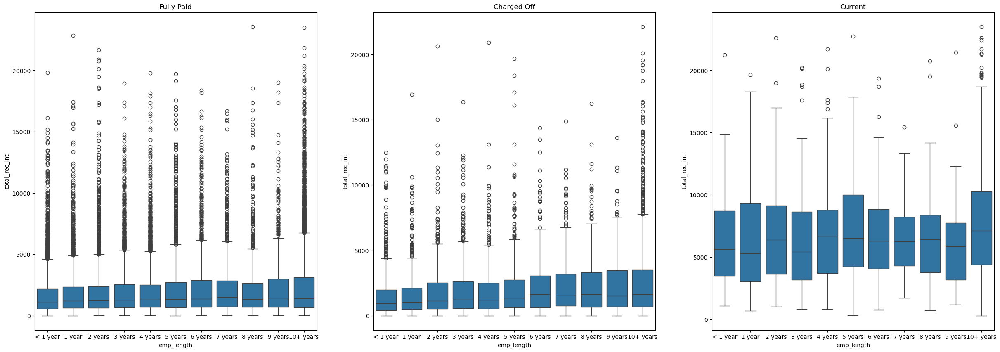

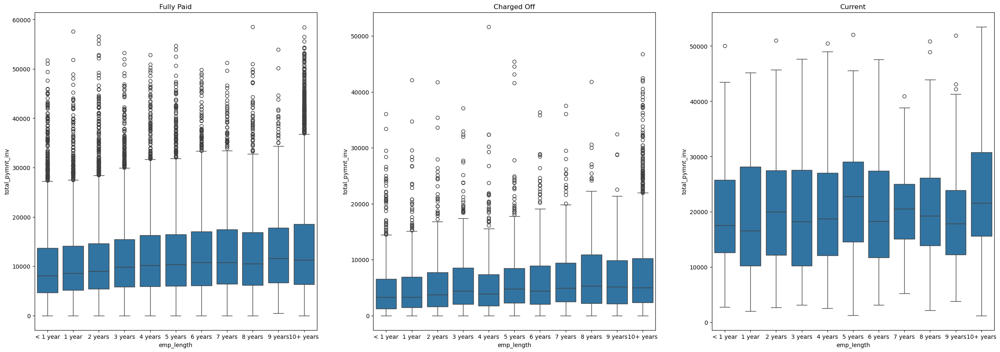

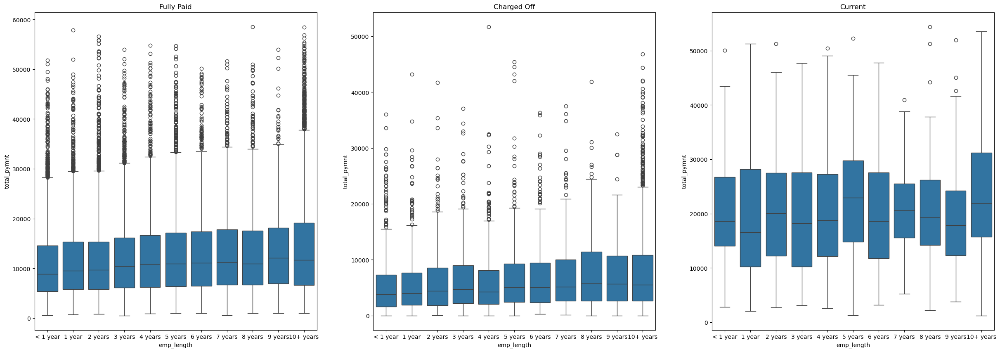

-------------------- purpose --------------------


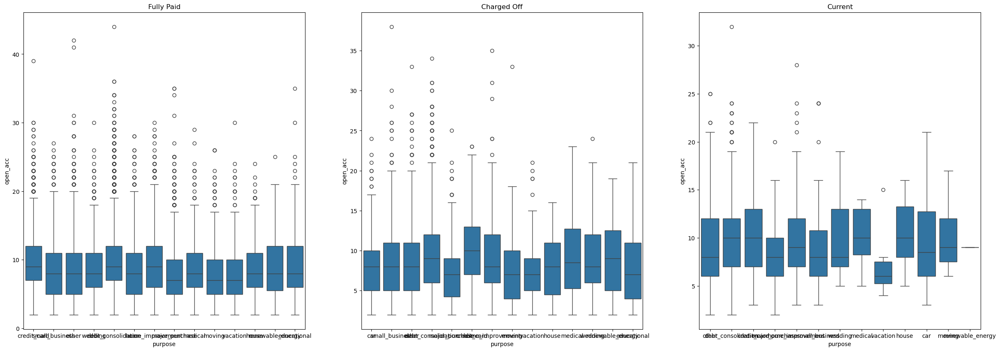

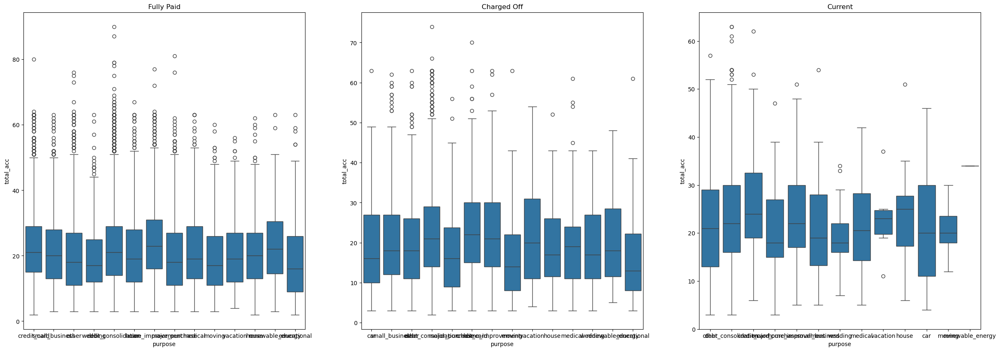

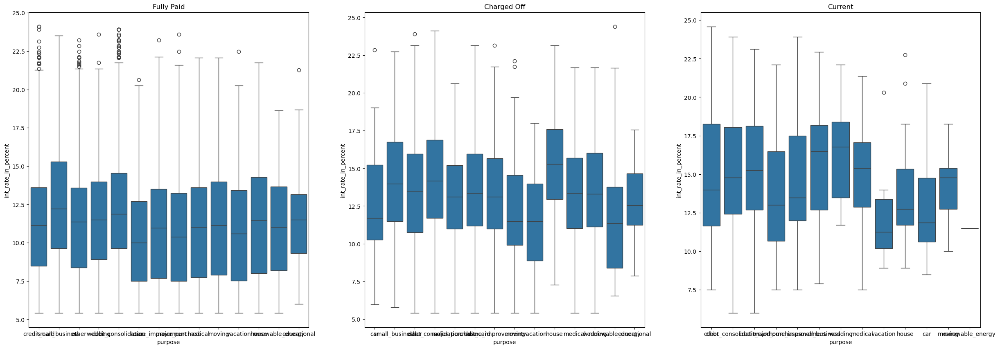

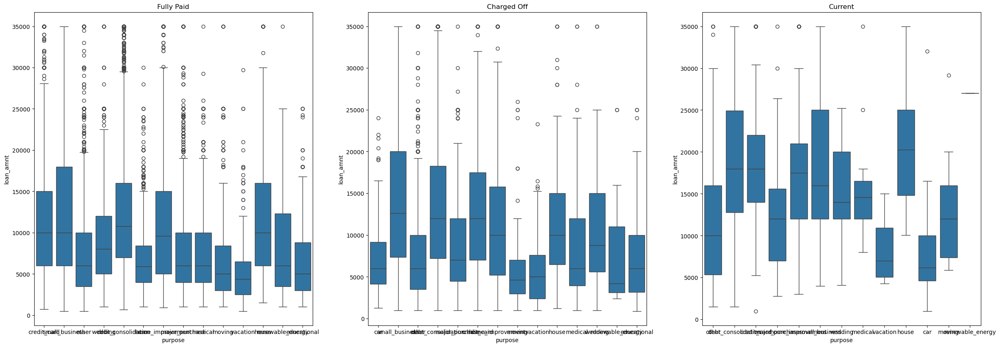

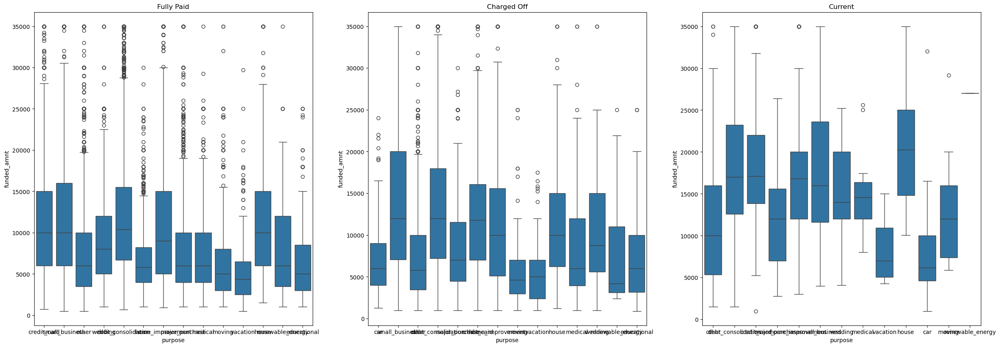

...

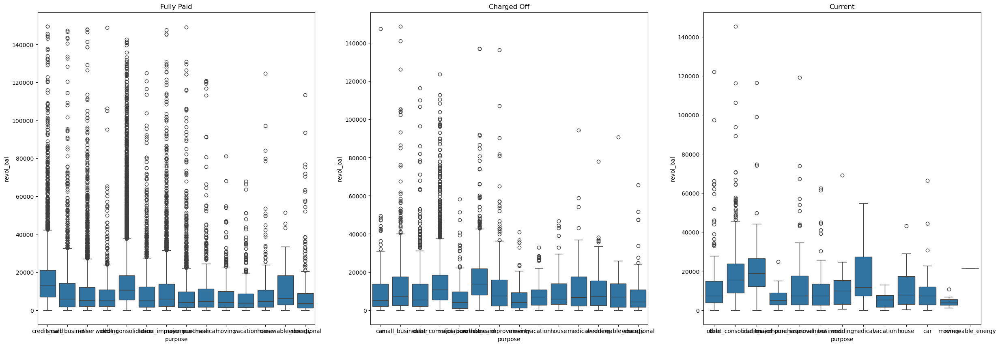

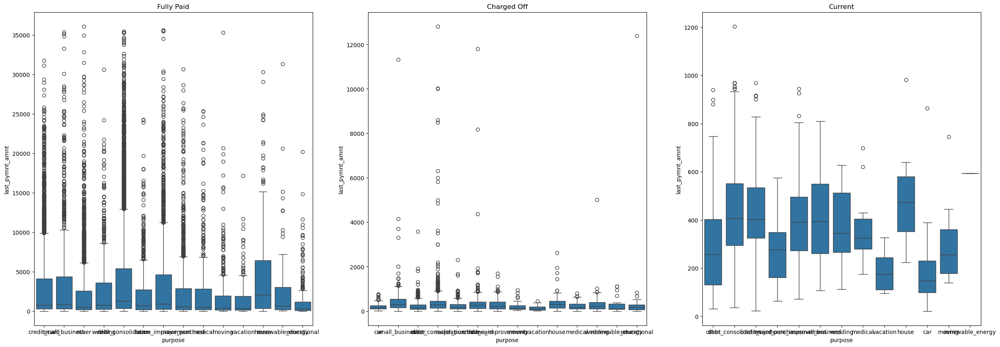

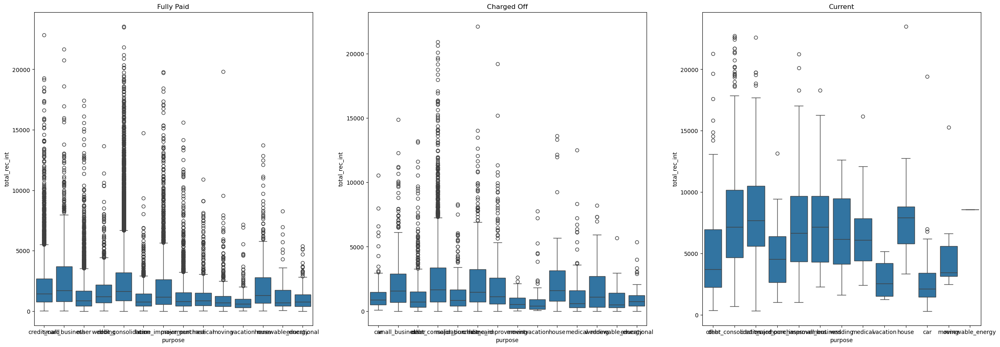

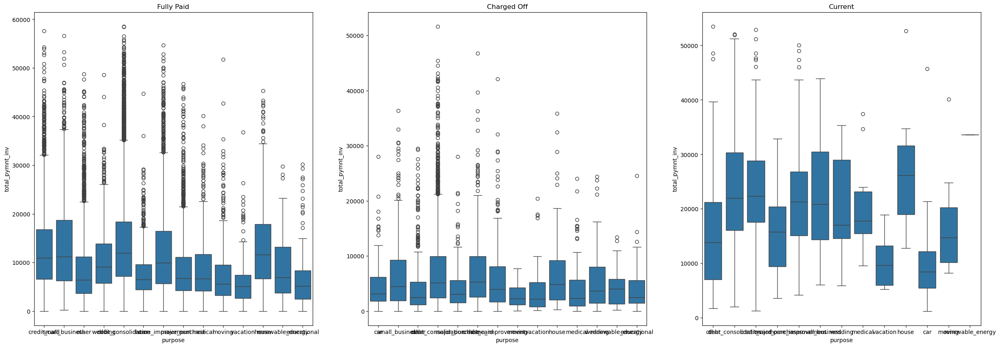

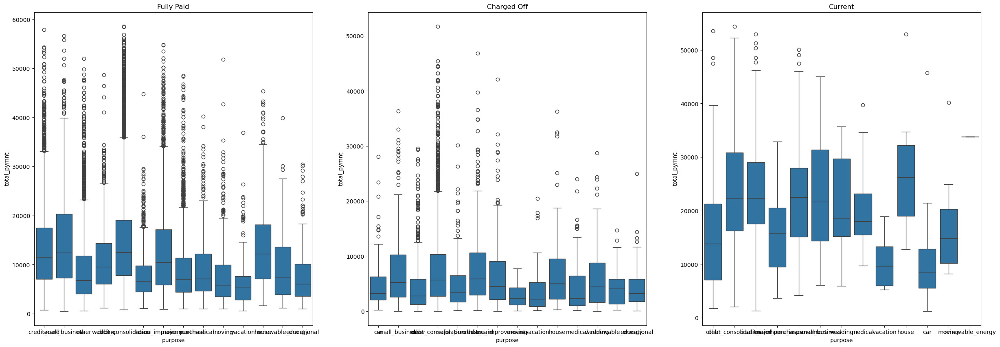

In [46]:
for col in second_cat_cols:
    print('-' * 20, col, '-' * 20)
    for num in num_cols:
        fig, axes = plt.subplots(1, 3, figsize=(30, 10))
        if col == 'grade' or col == 'emp_length':
            if col == 'grade':
                cat_order = ['A', 'B', 'C', 'D', 'E', 'F', 'G']
            elif col == 'emp_length':
                cat_order = ['< 1 year', '1 year', '2 years', '3 years', '4 years', '5 years', '6 years', '7 years', '8 years', '9 years', '10+ years']
            sns.boxplot(data=df[df.loan_status=="Fully Paid"], x=col, y=num, ax=axes[0], order=cat_order)
            sns.boxplot(data=df[df.loan_status=="Charged Off"], x=col, y=num, ax=axes[1], order=cat_order)
            sns.boxplot(data=df[df.loan_status=="Current"], x=col, y=num, ax=axes[2], order=cat_order)
        else:
            sns.boxplot(data=df[df.loan_status=="Fully Paid"], x=col, y=num, ax=axes[0])
            sns.boxplot(data=df[df.loan_status=="Charged Off"], x=col, y=num, ax=axes[1])
            sns.boxplot(data=df[df.loan_status=="Current"], x=col, y=num, ax=axes[2])
        axes[1].set_title('Charged Off')
        axes[0].set_title('Fully Paid')
        axes[2].set_title('Current')
        plt.show()

## Finding 5
for home_ownership is "MORTGAGE", loans with higher amount are likely to be "Charged Off"

In [47]:
df[(df.loan_status=='Charged Off') & (df.home_ownership=='MORTGAGE')].loan_amnt.describe()

count     2327.000000
mean     14095.186936
std       8617.972197
min       1000.000000
25%       7000.000000
50%      12000.000000
75%      20000.000000
max      35000.000000
Name: loan_amnt, dtype: float64

In [48]:
q = df[(df.loan_status=='Charged Off') & (df.home_ownership=='MORTGAGE')].loan_amnt.quantile(0.95)

In [49]:
likely_to_default_4 = df[(df.loan_status=='Current') & (df.home_ownership=='MORTGAGE') & (df.loan_amnt > q)]
likely_to_default_4

,loan_amnt,funded_amnt,funded_amnt_inv,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,purpose,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,last_credit_pull_d,pub_rec_bankruptcies,term_in_months,int_rate_in_percent,percent_total_pymnt_inv,percent_funded_amnt_inv
713,35000,22050,22050.0,572.36,E,E2,10+ years,MORTGAGE,140000.0,Verified,Dec-11,Current,small_business,970xx,OR,4.29,2,Dec-94,2,14,0,13948,75.40%,39,4337.79,4337.79,29801.33,29801.33,17712.21,12031.88,57.236585,0.0,0.0,May-16,572.36,May-16,0.0,60,19.03,100.000000,100.000000
866,35000,35000,34975.0,925.54,E,E4,4 years,MORTGAGE,69000.0,Verified,Dec-11,Current,home_improvement,300xx,GA,9.41,0,Jan-06,2,7,0,22921,70.70%,17,6071.68,6067.33,49047.38,49012.37,28928.31,20119.07,0.000000,0.0,0.0,May-16,925.54,May-16,0.0,60,19.91,99.928620,99.928571
1004,35000,22050,22025.0,495.19,B,B4,3 years,MORTGAGE,66000.0,Verified,Dec-11,Current,debt_consolidation,327xx,FL,8.96,0,Dec-96,0,12,0,16547,42.90%,17,2169.29,2166.81,27334.56,27303.60,19880.72,7453.84,0.000000,0.0,0.0,May-16,495.19,May-16,0.0,60,12.42,99.886737,99.886621
1177,35000,35000,35000.0,944.71,F,F1,< 1 year,MORTGAGE,174000.0,Verified,Dec-11,Current,home_improvement,300xx,GA,5.32,0,Jan-90,1,10,0,13393,26.50%,22,6182.86,6182.86,50051.69,50051.69,28817.14,21234.55,0.000000,0.0,0.0,May-16,944.71,Apr-16,0.0,60,20.89,100.000000,100.000000
1384,35000,35000,34975.0,773.44,B,B3,7 years,MORTGAGE,78000.0,Verified,Dec-11,Current,debt_consolidation,992xx,WA,16.63,0,Jul-91,0,10,0,28856,62.90%,37,5217.87,5214.11,40977.50,40948.28,29782.13,11195.37,0.000000,0.0,0.0,May-16,773.44,May-16,0.0,60,11.71,99.928693,99.928571
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13922,35000,35000,34950.0,913.52,E,E4,10+ years,MORTGAGE,78000.0,Verified,Jun-11,Current,credit_card,194xx,PA,24.23,0,Sep-98,1,7,0,42715,92.50%,19,1797.02,1794.39,52956.26,52880.72,33202.98,19753.28,0.000000,0.0,0.0,May-16,913.52,May-16,0.0,60,19.29,99.857354,99.857143
14619,32350,32350,32350.0,851.51,E,E5,10+ years,MORTGAGE,115740.0,Verified,Jun-11,Current,debt_consolidation,221xx,VA,21.93,0,Apr-92,1,19,0,36603,75%,42,1353.93,1353.93,50489.71,50489.71,30996.07,19493.64,0.000000,0.0,0.0,May-16,851.51,May-16,0.0,60,19.69,100.000000,100.000000
14652,35000,35000,34925.0,805.17,C,C2,10+ years,MORTGAGE,470000.0,Verified,May-11,Current,home_improvement,871xx,NM,8.44,0,Dec-88,0,13,0,16968,33.80%,36,814.14,812.33,47474.95,47373.33,34185.87,13289.08,0.000000,0.0,0.0,May-16,805.17,May-16,0.0,60,13.49,99.785950,99.785714
14984,35000,23650,23625.0,622.51,E,E5,10+ years,MORTGAGE,192000.0,Verified,May-11,Current,small_business,750xx,TX,11.70,0,Dec-97,3,8,0,19001,80.50%,28,632.33,631.57,36681.94,36643.39,23017.68,13664.26,0.000000,0.0,0.0,May-16,622.51,May-16,0.0,60,19.69,99.894907,99.894292


## Finding 6
There can be seen a marginal increase in the loan amount and funded amount with an increase in years of employee length in the case of "Charged Off" loans, which means, older employees taking a higher amount of loan are slightly more likely to be "Charged Off"

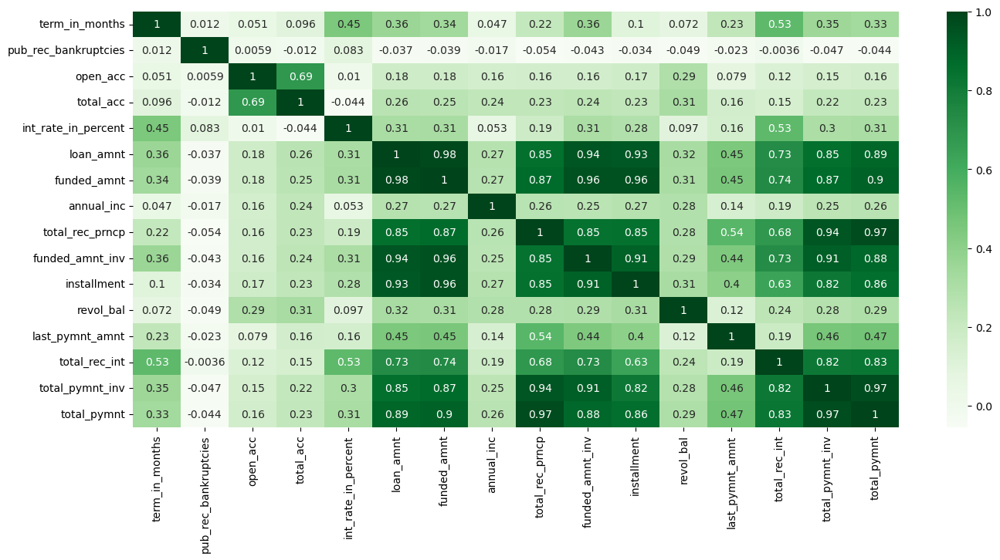

In [50]:
plt.figure(figsize=(16,7))
sns.heatmap(df[['term_in_months', 'pub_rec_bankruptcies', 'open_acc', 'total_acc', 'int_rate_in_percent',
                'loan_amnt', 'funded_amnt', 'annual_inc', 'total_rec_prncp', 'funded_amnt_inv', 'installment',
                'revol_bal', 'last_pymnt_amnt', 'total_rec_int', 'total_pymnt_inv', 'total_pymnt']].corr(), annot=True, cmap='Greens')
plt.show()

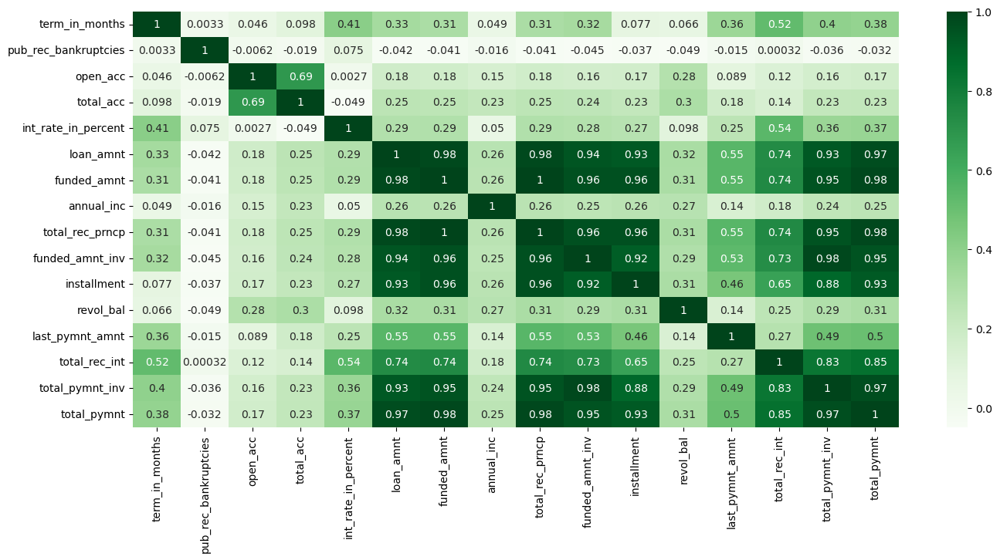

In [51]:
plt.figure(figsize=(16,7))
sns.heatmap(df[(df.loan_status=='Fully Paid')][['term_in_months', 'pub_rec_bankruptcies', 'open_acc', 'total_acc', 'int_rate_in_percent',
                'loan_amnt', 'funded_amnt', 'annual_inc', 'total_rec_prncp', 'funded_amnt_inv', 'installment',
                'revol_bal', 'last_pymnt_amnt', 'total_rec_int', 'total_pymnt_inv', 'total_pymnt']].corr(), annot=True, cmap='Greens')
plt.show()

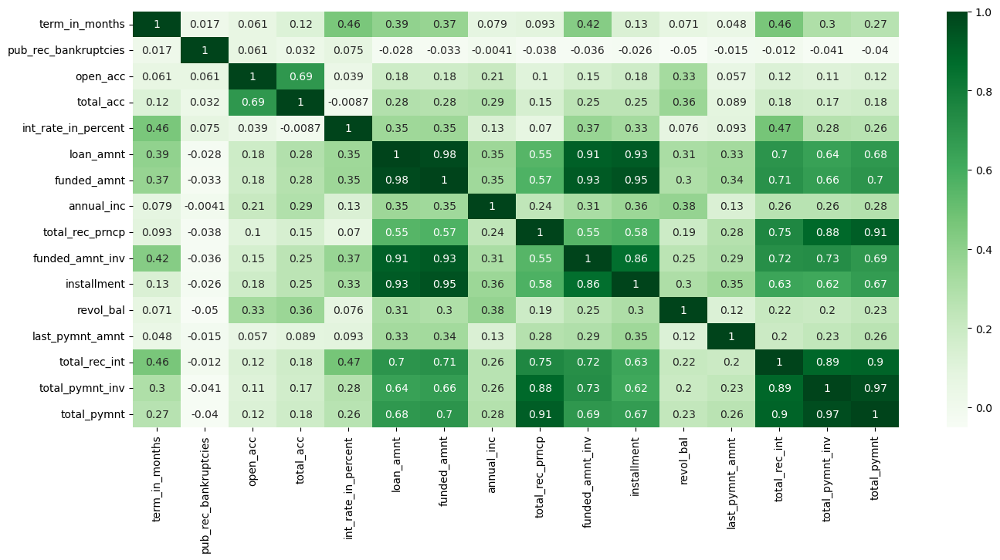

In [52]:
plt.figure(figsize=(16,7))
sns.heatmap(df[(df.loan_status=='Charged Off')][['term_in_months', 'pub_rec_bankruptcies', 'open_acc', 'total_acc', 'int_rate_in_percent',
                'loan_amnt', 'funded_amnt', 'annual_inc', 'total_rec_prncp', 'funded_amnt_inv', 'installment',
                'revol_bal', 'last_pymnt_amnt', 'total_rec_int', 'total_pymnt_inv', 'total_pymnt']].corr(), annot=True, cmap='Greens')
plt.show()

## Finding 7 
Higher the amount of total payments more likely it is "Fully Paid"